# Εργαστηριακή Άσκηση 2. Μη επιβλεπόμενη μάθηση. 
Ημερομηνία εκφώνησης άσκησης: 8/12/19
## Σύστημα συστάσεων βασισμένο στο περιεχόμενο
## Σημασιολογική απεικόνιση δεδομένων με χρήση SOM 



## ΣΤΟΙΧΕΙΑ ΟΜΑΔΑΣ

Αριθμός Ομάδας: M.B.9

Βλάχος Ιωάννης Α.Μ. 03115013<br>
Κασουρίδης Στυλιανός Α.Μ. 03115172<br>
Χαρδούβελης Γεώργιος-Ορέστης Α.Μ. 03115100<br>



In [ ]:
!pip install --upgrade pip
!pip install --upgrade numpy
!pip install --upgrade pandas
!pip install --upgrade nltk
!pip install --upgrade scikit-learn
!pip install --upgrade joblib

     |████████████████████████████████| 1.4MB 3.5MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1
     |████████████████████████████████| 20.1 MB 2.1 MB/s 
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Attempting uninstall: numpy
    Found existing installation: numpy 1.17.5
    Uninstalling numpy-1.17.5:
      Successfully uninstalled numpy-1.17.5


Requirement already up-to-date: pandas in /usr/local/lib/python3.6/dist-packages (0.25.3)
     |████████████████████████████████| 1.5 MB 3.5 MB/s 
  Created wheel for nltk: filename=nltk-3.4.5-py3-none-any.whl size=1449905 sha256=c8ab850faa03f7786277b14ae1809992367a0f2d59bbf8f02574101c5c4e25d8
  Stored in directory: /root/.cache/pip/wheels/e3/c9/b0/ed26a73ef75a53145820825afa8e2d2c9b30fe9f6c10cd3202
Successfully built nltk
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.5
    Uninstalling nltk-3.2.5:
      Successfully uninstalled nltk-3.2.5
Requirement already up-to-date: scikit-learn in /usr/local/lib/python3.6/dist-packages (0.22.1)
Requirement already up-to-date: joblib in /usr/local/lib/python3.6/dist-packages (0.14.1)


## Εισαγωγή του Dataset

Το σύνολο δεδομένων με το οποίο θα δουλέψουμε είναι βασισμένο στο [Carnegie Mellon Movie Summary Corpus](http://www.cs.cmu.edu/~ark/personas/). Πρόκειται για ένα dataset με περίπου 40.000 περιγραφές ταινιών. Η περιγραφή κάθε ταινίας αποτελείται από τον τίτλο της, μια ή περισσότερες ετικέτες που χαρακτηρίζουν το είδος της ταινίας και τέλος τη σύνοψη της υπόθεσής της. Αρχικά εισάγουμε το dataset (χρησιμοποιήστε αυτούσιο τον κώδικα, δεν χρειάζεστε το αρχείο csv) στο dataframe `df_data_1`: 

In [ ]:
import pandas as pd

dataset_url = "https://drive.google.com/uc?export=download&id=1PdkVDENX12tQliCk_HtUnAUbfxXvnWuG"
df_data_1 = pd.read_csv(dataset_url, sep='\t',  header=None, quoting=3, error_bad_lines=False)

Κάθε ομάδα θα δουλέψει σε ένα μοναδικό υποσύνολο 5.000 ταινιών (διαφορετικό dataset για κάθε ομάδα) ως εξής

1. Κάθε ομάδα μπορεί να βρει [εδώ](https://docs.google.com/spreadsheets/d/1oEr3yuPg22lmMeqDjFtWjJRzmGQ8N57YIuV-ZOvy3dM/edit?usp=sharing) τον μοναδικό  αριθμό της "Seed" από 1 έως 78. 

2. Το data frame `df_data_2` έχει 78 γραμμές (ομάδες) και 5.000 στήλες. Σε κάθε ομάδα αντιστοιχεί η γραμμή του πίνακα με το `team_seed_number` της. Η γραμμή αυτή θα περιλαμβάνει 5.000 διαφορετικούς αριθμούς που αντιστοιχούν σε ταινίες του αρχικού dataset. 

3. Στο επόμενο κελί αλλάξτε τη μεταβλητή `team_seed_number` με το Seed της ομάδας σας από το Google Sheet.

4. Τρέξτε τον κώδικα. Θα προκύψουν τα μοναδικά για κάθε ομάδα  titles, categories, catbins, summaries και corpus με τα οποία θα δουλέψετε.

In [ ]:
import numpy as np

# βάλτε το seed που αντιστοιχεί στην ομάδα σας
team_seed_number = 24

movie_seeds_url = "https://drive.google.com/uc?export=download&id=1RRoiOjhD0JB3l4oHNFOmPUqZHDphIdwL"
df_data_2 = pd.read_csv(movie_seeds_url, header=None, error_bad_lines=False)

# επιλέγεται 
my_index = df_data_2.iloc[team_seed_number,:].values

titles = df_data_1.iloc[:, [2]].values[my_index] # movie titles (string)
categories = df_data_1.iloc[:, [3]].values[my_index] # movie categories (string)
bins = df_data_1.iloc[:, [4]]
catbins = bins[4].str.split(',', expand=True).values.astype(np.float)[my_index] # movie categories in binary form (1 feature per category)
summaries =  df_data_1.iloc[:, [5]].values[my_index] # movie summaries (string)
corpus = summaries[:,0].tolist() # list form of summaries

- Ο πίνακας **titles** περιέχει τους τίτλους των ταινιών. Παράδειγμα: 'Sid and Nancy'.
- O πίνακας **categories** περιέχει τις κατηγορίες (είδη) της ταινίας υπό τη μορφή string. Παράδειγμα: '"Tragedy",  "Indie",  "Punk rock",  "Addiction Drama",  "Cult",  "Musical",  "Drama",  "Biopic \[feature\]",  "Romantic drama",  "Romance Film",  "Biographical film"'. Παρατηρούμε ότι είναι μια comma separated λίστα strings, με κάθε string να είναι μια κατηγορία.
- Ο πίνακας **catbins** περιλαμβάνει πάλι τις κατηγορίες των ταινιών αλλά σε δυαδική μορφή ([one hot encoding](https://hackernoon.com/what-is-one-hot-encoding-why-and-when-do-you-have-to-use-it-e3c6186d008f)). Έχει διαστάσεις 5.000 x 322 (όσες οι διαφορετικές κατηγορίες). Αν η ταινία ανήκει στο συγκεκριμένο είδος η αντίστοιχη στήλη παίρνει την τιμή 1, αλλιώς παίρνει την τιμή 0.
- Ο πίνακας **summaries** και η λίστα **corpus** περιλαμβάνουν τις συνόψεις των ταινιών (η corpus είναι απλά ο summaries σε μορφή λίστας). Κάθε σύνοψη είναι ένα (συνήθως μεγάλο) string. Παράδειγμα: *'The film is based on the real story of a Soviet Internal Troops soldier who killed his entire unit  as a result of Dedovschina. The plot unfolds mostly on board of the prisoner transport rail car guarded by a unit of paramilitary conscripts.'*
- Θεωρούμε ως **ID** της κάθε ταινίας τον αριθμό γραμμής της ή το αντίστοιχο στοιχείο της λίστας. Παράδειγμα: για να τυπώσουμε τη σύνοψη της ταινίας με `ID=99` (την εκατοστή) θα γράψουμε `print(corpus[99])`.

In [ ]:
ID = 99
print(titles[ID])
print(categories[ID])
print(catbins[ID])
print(corpus[ID])

['Out of Time']
['"Science Fiction"']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 

# Εφαρμογή 1. Υλοποίηση συστήματος συστάσεων ταινιών βασισμένο στο περιεχόμενο
<img src="http://clture.org/wp-content/uploads/2015/12/Netflix-Streaming-End-of-Year-Posts.jpg" width="70%">

Η πρώτη εφαρμογή που θα αναπτύξετε θα είναι ένα [σύστημα συστάσεων](https://en.wikipedia.org/wiki/Recommender_system) ταινιών βασισμένο στο περιεχόμενο (content based recommender system). Τα συστήματα συστάσεων στοχεύουν στο να προτείνουν αυτόματα στο χρήστη αντικείμενα από μια συλλογή τα οποία ιδανικά θέλουμε να βρει ενδιαφέροντα ο χρήστης. Η κατηγοριοποίηση των συστημάτων συστάσεων βασίζεται στο πώς γίνεται η επιλογή (filtering) των συστηνόμενων αντικειμένων. Οι δύο κύριες κατηγορίες είναι η συνεργατική διήθηση (collaborative filtering) όπου το σύστημα προτείνει στο χρήστη αντικείμενα που έχουν αξιολογηθεί θετικά από χρήστες που έχουν παρόμοιο με αυτόν ιστορικό αξιολογήσεων και η διήθηση με βάση το περιεχόμενο (content based filtering), όπου προτείνονται στο χρήστη αντικείμενα με παρόμοιο περιεχόμενο (με βάση κάποια χαρακτηριστικά) με αυτά που έχει προηγουμένως αξιολογήσει θετικά.

Το σύστημα συστάσεων που θα αναπτύξετε θα βασίζεται στο **περιεχόμενο** και συγκεκριμένα στις συνόψεις των ταινιών (corpus). 


## Μετατροπή σε TFIDF

Το πρώτο βήμα θα είναι λοιπόν να μετατρέψετε το corpus σε αναπαράσταση tf-idf:

In [ ]:
#define list of stop_words
stop_words1 = ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]

stop_words1 = stop_words1 + ['film','movie','plot','scene']


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words= stop_words1, max_df=0.8, min_df=30, max_features=3000)
vectorizer.fit(corpus)
corpus_tf_idf = vectorizer.transform(corpus)

Η συνάρτηση [TfidfVectorizer](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) όπως καλείται εδώ **δεν είναι βελτιστοποιημένη**. Οι επιλογές των μεθόδων και παραμέτρων της μπορεί να έχουν **δραματική επίδραση στην ποιότητα των συστάσεων** και είναι διαφορετικές για κάθε dataset. Επίσης, οι επιλογές αυτές έχουν πολύ μεγάλη επίδραση και στη **διαστατικότητα και όγκο των δεδομένων**. Η διαστατικότητα των δεδομένων με τη σειρά της θα έχει πολύ μεγάλη επίδραση στους **χρόνους εκπαίδευσης**, ιδιαίτερα στη δεύτερη εφαρμογή της άσκησης. Ανατρέξτε στα notebooks του εργαστηρίου και στο [FAQ](https://docs.google.com/document/d/1-E4eQkVnTxa3Jb0HL9OAs11bugYRRZ7RNWpu7yh9G4s/edit?usp=sharing) των ασκήσεων.


In [ ]:
#check size with changes
print(corpus_tf_idf.shape)
print(corpus_tf_idf[2].data.size)

(5000, 3000)
56


## Υλοποίηση του συστήματος συστάσεων

Το σύστημα συστάσεων που θα παραδώσετε θα είναι μια συνάρτηση `content_recommender` με δύο ορίσματα `target_movie` και `max_recommendations`. Στην `target_movie` περνάμε το ID μιας ταινίας-στόχου για την οποία μας ενδιαφέρει να βρούμε παρόμοιες ως προς το περιεχόμενο (τη σύνοψη) ταινίες, `max_recommendations` στο πλήθος.
Υλοποιήστε τη συνάρτηση ως εξής: 
- για την ταινία-στόχο, από το `corpus_tf_idf` υπολογίστε την [ομοιότητα συνημιτόνου](https://en.wikipedia.org/wiki/Cosine_similarity) της με όλες τις ταινίες της συλλογής σας
- με βάση την ομοιότητα συνημιτόνου που υπολογίσατε, δημιουργήστε ταξινομημένο πίνακα από το μεγαλύτερο στο μικρότερο, με τα indices (`ID`) των ταινιών. Παράδειγμα: αν η ταινία με index 1 έχει ομοιότητα συνημιτόνου με 3 ταινίες \[0.2 1 0.6\] (έχει ομοιότητα 1 με τον εαύτό της) ο ταξινομημένος αυτός πίνακας indices θα είναι \[1 2 0\].
- Για την ταινία-στόχο εκτυπώστε: id, τίτλο, σύνοψη, κατηγορίες (categories)
- Για τις `max_recommendations` ταινίες (πλην της ίδιας της ταινίας-στόχου που έχει cosine similarity 1 με τον εαυτό της) με τη μεγαλύτερη ομοιότητα συνημιτόνου (σε φθίνουσα σειρά), τυπώστε σειρά σύστασης (1 πιο κοντινή, 2 η δεύτερη πιο κοντινή κλπ), id, τίτλο, σύνοψη, κατηγορίες (categories)


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

def content_recommender(target_movie, max_recommendations):
  #input = movie_id & num of recommendations
  #output = recommendations by measuring cosine similarity from corpus tf_idf
  cos_sims = [cosine_similarity(corpus_tf_idf[target_movie], x) for x in corpus_tf_idf]
  cos_sims = [(cos_sims[i][0][0], i) for i in range(len(cos_sims))]
  cos_sims.sort(reverse=True)
  for i in cos_sims[1:max_recommendations+1]:
    print(i[1], titles[i[1]], categories[i[1]], corpus[i[1]])

In [ ]:
index=999
#209 school 
#999 war films and asian films
#3811 wedding blah blah, one asian
#4990 indian, gangs, romantic ijlknm,
#5 indian and marrriage and 51 ti einai auto?
#78 musical / music
#300 horse all the way
#67 cars racing
#2315 school and parents and teachers
#1113 cartoons
print(titles[index], categories[index], corpus[index])

['Japanese War Bride'] ['"Drama",  "Black-and-white",  "War film"'] The film tells the story of a wounded Korean War veteran, Jim Sterling ([[Don Taylor , who returns to his California home with his Japanese wife. The couple had met and fallen in love in a Japanese hospital where Tae Shimizu  was working as a nurse. Back in America, the two face racism and bigotry from their neighbours and family, particularly their sister-in-law, Fran .


In [ ]:
max_rec = 6
content_recommender(index, max_recommendations=max_rec)

1659 ['City of Life and Death'] ['"Anti-war",  "World cinema",  "History",  "Historical fiction",  "Black-and-white",  "Period piece",  "Drama",  "War film",  "Historical Epic",  "Anti-war film",  "Chinese Movies"'] City of Life and Death is set in 1937, shortly after the beginning of the Second Sino-Japanese War. The Imperial Japanese Army has just captured Nanjing , capital of the Republic of China. What followed is historically known as the Nanking Massacre, a period of several weeks wherein massive numbers of Chinese prisoners-of-war and civilians were killed by the Japanese military. After some commanders of the National Revolutionary Army flee Nanking, a Chinese soldier Lieutenant Lu Jianxiong and his comrade-in-arms Shunzi attempt to stop a group of deserting troops from leaving the city, but as they exit the gates, they are captured by Japanese forces that have surrounded the city. As the Japanese comb the city for enemy forces, Superior Private  Kadokawa Masao and his men are 

## Βελτιστοποίηση

Αφού υλοποιήσετε τη συνάρτηση `content_recommender` χρησιμοποιήστε τη για να βελτιστοποιήσετε την `TfidfVectorizer`. Συγκεκριμένα, αρχικά μπορείτε να δείτε τι επιστρέφει το σύστημα για τυχαίες ταινίες-στόχους και για ένα μικρό `max_recommendations` (2 ή 3). Αν σε κάποιες ταινίες το σύστημα μοιάζει να επιστρέφει σημασιολογικά κοντινές ταινίες σημειώστε το `ID` τους. Δοκιμάστε στη συνέχεια να βελτιστοποιήσετε την `TfidfVectorizer` για τα συγκεκριμένα `ID` ώστε να επιστρέφονται σημασιολογικά κοντινές ταινίες για μεγαλύτερο αριθμό `max_recommendations`. Παράλληλα, όσο βελτιστοποιείτε την `TfidfVectorizer`, θα πρέπει να λαμβάνετε καλές συστάσεις για μεγαλύτερο αριθμό τυχαίων ταινιών. Μπορείτε επίσης να βελτιστοποιήσετε τη συνάρτηση παρατηρώντας πολλά φαινόμενα που το σύστημα εκλαμβάνει ως ομοιότητα περιεχομένου ενώ επί της ουσίας δεν είναι επιθυμητό να συνυπολογίζονται (δείτε σχετικά το [FAQ](https://docs.google.com/document/d/1-E4eQkVnTxa3Jb0HL9OAs11bugYRRZ7RNWpu7yh9G4s/edit?usp=sharing)). Ταυτόχρονα, μια άλλη κατεύθυνση της βελτιστοποίησης είναι να χρησιμοποιείτε τις παραμέτρους του `TfidfVectorizer` έτσι ώστε να μειώνονται οι διαστάσεις του Vector Space Model μέχρι το σημείο που θα αρχίσει να εμφανίζονται επιπτώσεις στην ποιότητα των συστάσεων. 




## Επεξήγηση επιλογών και ποιοτική ερμηνεία

Σε markdown περιγράψτε πώς προχωρήσατε στις επιλογές σας για τη βελτιστοποίηση της `TfidfVectorizer`. Επίσης σε markdown δώστε 10 παραδείγματα (IDs) από τη συλλογή σας που επιστρέφουν καλά αποτελέσματα μέχρι `max_recommendations` (5 και παραπάνω) και σημειώστε συνοπτικά ποια είναι η θεματική που ενώνει τις ταινίες.

Δείτε [εδώ](https://pastebin.com/raw/ZEvg5t3z) ένα παράδειγμα εξόδου του βελτιστοποιημένου συστήματος συστάσεων για την ταίνία ["Q Planes"](https://en.wikipedia.org/wiki/Q_Planes) με την κλήση της συνάρτησης για κάποιο seed `content_recommender(529,3)`. Είναι φανερό ότι η κοινή θεματική των ταινιών είναι τα αεροπλάνα, οι πτήσεις, οι πιλότοι, ο πόλεμος.

## Απάντηση

### Βελτιστοποίηση της TfidfVectorizer

Στο πρώτο βήμα της άσκησης μας αναπτύχθηκε ένα σύστημα συστάσεων ταινιών βασισμένο στο περιεχόμενο τους.
Αρχικά μετατρέψαμε το corpus, που είναι μια λίστα που περιέχει συνόψεις ταινιών σε αναπαράσταση tf-idf, με την χρήση της συνάρτησης TFidfCevtorizer. Στη συνέχεια υλοποιήσαμε την συνάρτηση content_recommender, που υπολογίζει την ομοιότητα συνημιτόνου μιας ταινίας με όλες τις υπόλοιπες. Έτσι, ταξινομώντας τα αποτελέσματα αναδεικνύονται τα περισσότερο όμοια αποτελέσματα. 

Παρόλα αυτά η συνάρτηση TfidfVectorizer δεν είναι βελτιστοποιημένη μιας και η προεπεξεργασία των δεδομένων μας μπορεί να έχει μεγαλη επίδραση στις προτεινόμενες ταινίες, αναλόγως το dataset. Ταυτόχρονα, μειώνεται αρκετά και ο όγκος των δεδομένων, ο οποίος διαδραματίζει σημαντικό ρόλο στην ταχύτητα εκπαίδευσης των δεδομένων.

Ο τρόπος για να γίνει η βελτιστοποίηση ήταν αναγκαστικά "με το χέρι", βλέποντας τι επιστρέφει η συνάρτηση μεταβάλλοντας σταδιακά παραμέτρους και κοιτώντας τα αποτελέσματα, ώστε να μειωθεί στο ελάχιστο ο όγκος έχοντας τις καλύτερες προτάσεις ταινιών.

Πριν αναλύσουμε την διαδικασία βελτιστοποίησης, οφείλουμε να αναφέρουμε κάποιες γενικές πληροφορίες για την TF-IDF. Το πλήρες όνομα είναι το Term Frequency-Inverse Document Frequency. Όπως είδαμε και στο εργαστήριο, αποτελείται από δύο όρους. 
Ο πρώτος είναι ο tf (term frequency) και ουσιαστικά είναι η συχνότητα με την οποία εμφανιζεται ο κάθε όρος στο κείμενο. Η λογική είναι πως οι όροι που εμφανίζονται πιο συχνά και έχουν μεγαλύτερη συχνότητα θεωρούνται πιο σημαντικές.
Ο δεύτερος όρος είναι το idf (Inverse Document Frequency). Αποτελεί δείκτη πληροφρορίας που δίνει η κάθε λέξη. Δηλαδή, αν η λέξη εμφανίζεται σε όλα τα κείμενα, δεν δίνει πληροφορία, ενώ σε όσο λιγότερα εμφανίζεται, θα έχει μεγαλύτερη.

Αρχικά, τρέξαμε να δούμε τις συστάσεις που έβγαζε το σύστημα ως έχει. Αν και υπήρχαν κάποιες καλές συστάσεις, ήταν οι μειονότητα από αυτές που επέστρεφε η συνάρτηση. Ακόμη η συνολική διαδικασία ήταν ακρετά χρονοβόρα.

Έτσι, ξεκινήσαμε ορίζοντας stop_words. Μέσω αυτής της παραμέτρου στην συνάρτηση ορίζουμε λέξεις οι οποίες αφαιρούνται απο τα δεδομένα και συνεπώς δεν συμμετέχουν στον υπολογισμό της ομοιότητας συνημιτόνου. Ως τέτοιες λέξεις παραδοσιακά επιλέγονται οι πιο συχνά χρησιμοποιημένες λέξεις στην αλφάβητο της γλώσσας στην οποία είναι τα δεδομένα μας (αγγλικά στην περίπτωση μας). Πήραμε λοιπόν τις λέξεις που έχει ως default η συνάρτηση (='english') και είδαμε πως υπήρχε μεγάλη πτώση στον όγκο δεδομένων καθώς και σημαντική βελτίσωη στις συστάσεις. 
Στη συνέχεια, προσθέσαμε στις "stop_words" και κάποιες που χρησιμοποιούνται συχνά στις συνόψεις ταινιών, όπως 'film', 'movie', 'plot', 'scene' και τα είχαμε ακόμη καλύτερα αποτελέσματα.

Στην συνέχεια μεταβάλλαμε την παράμετρο max_df. Σε αυτή την παράμετρο ορίζουμε ποσοστό στο οποίο όροι με μεγαλύτερη συχνότητα από αυτό αφαιρούνται. Η χρησιμότητα του είναι όμοια με τα stop_words, αφού στοχεύει στο αν αφαιρέσουμε λέξεις που χρησιμοποιούνται συχνά άλλα δεν έχουν χρήσιμη πληροφορία που μας βοηθάει στο σύστημα προτάσεών μας. Ξεκινήσαμε για μεγάλες τιμές του max_df (0.95, 0.9), αλλά δεν υπήρχε διαφορά γιατί δύσκολα φτάνει αυτό το ποσοστό κάποιος όρος, ενώ οι πιο συχνές λέξεις είχαν αφαιρεθέι ήδη. Για max_df=0.8 υπήρχε μια μικρή μείωση στο μέγεθος (αν και τα αποτελέσματα φάνηκαν να είναι ίδια). Για μικρότερες τιμές είδαμε χειρότερα αποτελέσματα οπότε την κρατήσαμε σταθερή στα 0.8.

Ύστερα επικεντρωθήκαμε στην παράμετρο min_df. Αυτή η παράμετρος αφαιρεί λέξεις με μικρή συχνότητα εμφάνισης. Συγκεκριμένα, μπορεί είτε να οριστεί ομοίως με παραπάνω με ποσοστό, είτε με αριθμό λέξεως που θα αποκοπούν. Εμείς το μελετήσαμε με αριθμό λέξεων γιατί μας ήταν ποιοτικά πιο κατανοητό. Στην αρχή ξεκινήσαμε με 50 λέξεις αλλά τα αποτελέσματα ήταν χειρότερα απο πριν. Ανεβάσαμε μετά τον αριθμό των λέξεων (80, 100, 150) αλλά μειώθηκε πολύ ο όγκος και υπήρχαν αρκετές προτεινόμενες ταινίες που δεν ταιριάζαν με την μελετούμενη. Έτσι ξεκινήσαμε από λίγες λέξεις (10), και αρχίζαμε να ανεβάζουμε. Στις πρώτες προσπάθειες τα αποτελέσματα δεν ήταν καλύτερα από ότι να είχαμε την παράμετρο ίση με μηδέν. Τελικά για min_df = 30 είδαμε βελτίωση στα αποτελέσματα (ενώ για παραπάνω επιδείνωση). Έτσι το κρατήσαμε εκεί.

Επόμενη παράμετρο που εξετάσαμε είναι η max_features. Για κάθε περίληψη προκύπτεί ένας συγκεκριμένος αριθμός χαρακτηριστικών (λέξεων) διαφορετικός για κάθε περίπτωση. Με αυτή την παράμετρο ορίζουμε τον μέγιστο αριθμό χαρακτηριστικών για κάθε περίπτωση. Αν έχει ήδη λιγότερα στη συγκεκριμένη ταινία δεν υπάρχει αλλαγή, αν όμως έχει περισσότερα διατηρεί τα πρώτα max_features και την μεγαλύτερη συχνότητα εμφάνισης.
Στην περίπτωση μας, με βάση τα παραπάνω είχαμε 3549 μέγιστα χαρακτηριστικά. Μειώνοντας τα σταδιακά στα 3000 είχαμε αρκετά καλύτερα αποτελέσματα, μιας και περισσότερες από τις προτεινόμενες ταινίες ταιριάζαν με αυτή που μελετάγαμε κάθε φορά. Μειώνοντας το στα 2000 είδαμε πως μειώθηκε η απόδοση, και πολλές φορές πρότεινε ταινίες με πολύ μικρή σύνοψη χωρίς σαφές θέμα. Αυξάνοντας σταδιακά είδαμε πως για 3000 χαρακτηριστικά είχαμε τα βέλτιστα αποτελέσματα και το κρατήσαμε εκεί.
Αυτό είναι λογικό μιας και κόβωντας τις πρώτες λέξεις δεν συνυπολογίζουμε κάποιες λέξεις που δεν είναι χρήσιμες στην σύγκριση, αλλά από ένα σημείο και μετά μικραίνει πολύ το dataset και χάνουμε λέξεις με ιδιαίτερη σημασία στην σύγκριση,

Ένα άλλο θέμα που μας απασχόλησε ήταν οι λέξεις που ξεκινούσαν με κεφαλαία γράμματα. 
Ξεκινήσαμε δοκιμάζοντας την παράμετρο lowercase, που μετατρέπει όλα τα κεφαλαία γράμματα σε μικρά. Διαφορετικά τις λέξεις Africa και africa τις προσλαμβάνει ως διαφορετικές. Αυτό στις περισσότερες ταινίες προφανώς δεν είχε μεγάλη διαφορά αλλά στα κινούμενα σχέδια είδαμε επιδείνωση (ίσως επειδή υπάρχουν ομόματα που ταυτίζονται με λέξεις). Έτσι δεν το χρησιμοποιήσαμε.
Μια άλλη ιδέα που υπολοιείται συχνά σε εφαρμογές text mining είναι η προεπεξεργασία των δεδομένων ώστε να αφιρεθούν όλες οι λέξεις με κεφαλαία γράμματα, μιας και λέξεις όπως ονόματα που μπορεί να είναι κοινά σε δύο συνόψεις μπορούν να μπερδέψουν τα αποτελέσματα. Παρόλα αυτά πάλι είδαμε χειρότερα αποτελέσματα και το αφαιρέσαμε.
Ένας πιθανός λόγος είναι πως ονόματα πόλεων και χωρών δίνουν πληροφορία για την χώρα από όπου προέρχεται η ταινία, το οποίο είναι ενδεικτικό για την συνολική κουλτούρα που ακολουθεί. Για αυτό άλλωστε τα αποτελέσματα δεν ήταν καλά ειδικά σε ξενόγλωσσες ταινίες (ινδικές, ιαπωνικές, κοκ). Παράλληλα, ορισμένες φορές τα ονόματα είναι επίσης χαρακτηριστικά για την ταινία, όπως σε ταινίες κινουμένων σχεδίων, όπου αφού αφαιρέσαμε τις λέξεις που ξεκινούσαν με κεφαλάιο, δεν προτείνονταν τόσα κινούμενα σχέδια.


### Παραδείγματα

Παρακάτω φαίνεται 10 παραδείγματα ταινιών, για τις οποίες το συστημα μας επιστρέφει 6 καλά αποτελέσματα. Σε κάθε bullet θα λεχουμε την μελετούμενη ταινία (ID, όνομα και κατηγορία) και στα sub bullets. Στο τέλος αναφέρεται και η θεματική που ενώνει τις ταινίες.

- 209 Cheats ['"Comedy",  "Teen"']
  - 1791 High School ['"Stoner film",  "Comedy",  "Indie"']
  - 3138 The Haunted School ['"Horror"']
  - 4758 Light it Up ['"Crime Fiction",  "Melodrama",  "Coming of age",  "Drama",  "Crime Thriller",  "Teen"']
  - 974 Ahead of the Class ['"Drama"']
  - 34 Recess: Taking the Fifth Grade ['"Family Film",  "Comedy",  "Animation"']
  - 2254 Freedom Writers ['"Crime Fiction",  "Biography",  "Drama",  "Teen"']

  Κοινή θεματική των παραπάνω ταινιών είναι το σχολείο, μιας και σε όλες η δευτεροβάθμια εκπαίδευση και ο σχολικός χώρος παίζουν βασικό ρόλο στην υπόθεση.

- 999 Japanese War Bride ['"Drama",  "Black-and-white",  "War film"']
  - 1659 City of Life and Death ['"Anti-war",  "World cinema",  "History",  "Historical fiction",  "Black-and-white",  "Period piece",  "Drama",  "War film",  "Historical Epic",  "Anti-war film",  "Chinese Movies"']
  - 1546 Purple Sunset ['"Action/Adventure",  "Drama",  "Chinese Movies",  "World cinema",  "War film"']
  - 638 New Fist of Fury ['"Action/Adventure",  "Action",  "Martial Arts Film",  "Chinese Movies",  "World cinema"']
  - 3464 Extra Human Being ['"Drama"']
  - 3355 Too Late the Hero ['"Action/Adventure",  "Action",  "Drama",  "War film"']
  - 2630 Going All the Way ['"Indie",  "Period piece",  "Drama",  "Comedy",  "Film adaptation",  "Romantic drama",  "Romance Film"']

  Κοινή θεματική είναι πως όλες έχουν να κάνουν με πόλεμο και στρατό, ενώ ως επί τω πλείστω διαδραματίζονται στην Ιαπωνία και είναι Ιαπωνικές.


- 3811 Marigold ['"Romantic comedy",  "Romance Film",  "Musical",  "Comedy"']
  - 4864 The House of the Spirits ['"Thriller",  "Indie",  "Supernatural",  "Family Drama",  "Epic",  "Mystery",  "Period piece",  "Drama",  "Suspense",  "Film adaptation",  "Romantic drama",  "Romance Film",  "Political drama"']
  - 2907 Padayappa ['"Romance Film",  "Drama"']
  - 1919 The Proposal ['"Romantic comedy",  "Romance Film",  "Drama",  "Comedy"']
  - 1451 Last Chance Harvey ['"Romantic drama",  "Romance Film",  "Drama",  "Indie",  "Slice of life story"']
  - 663 An Autumn Afternoon ['"Japanese Movies",  "Art film",  "World cinema",  "Family Drama",  "Comedy-drama",  "Drama",  "Romantic drama"']
  - 277 Preet Na Jane Reet ['"Romance Film"']

  Εδώ οι ταινίες σχετίζονται με τον γάμο με τον ένα ή τον άλλο τρόπο. Οι περισσότερες είναι ρομαντικές. Ταυτόχρονα, μιας και η ταινία που εξετάζουμε είναι του Bollywood, ένα μεγάλο ποσοστό των προτεινόμενων είναι επίσης από Ασία.

- 67 Redline ['"Science Fiction",  "Animation",  "Sports",  "Anime",  "Fantasy",  "Action",  "Auto racing"']
  - 654 Checkered Flag or Crash ['"Comedy film",  "Adventure"']
  - 534 Bicycle Dreams ['"Sports",  "Adventure",  "Documentary"']
  - 4749 Talladega Nights: The Ballad of Ricky Bobby ['"Parody",  "Action/Adventure",  "Sports",  "Comedy",  "Action",  "Auto racing"']
  - 2622 Mabel at the Wheel ['"Short Film",  "Silent film",  "Indie",  "Black-and-white",  "Comedy"'] 
  - 437 The Fast and the Furious ['"Crime Fiction",  "Thriller",  "Sports",  "Action/Adventure",  "Action",  "Auto racing"']
  - 2527 Speed Racer ['"Adventure",  "Chase Movie",  "Sports",  "Adventure Comedy",  "Family Film",  "Action"']

  Οι παραπάνω ταινίες έχουν να κάνουν με αμάξια και αγώνες, με εξαίρεση μια που πάλι έχει αθλητικούς αγώνες αλλά με ποδήλατα.

- 4990 Aaghaaz ['"Crime Fiction",  "Drama",  "Romance Film",  "Action",  "Gangster Film"'] 
  - 2256 Aval oru thodharkadai ['"Romance Film",  "Drama"'] 
  - 3395 Uncorked ['"Romance Film"']
  - 4460 The Timidity of the Loverat ['"Drama"']
  - 2907 Padayappa ['"Romance Film",  "Drama"']
  - 4248 Krishna Prema ['"Musical",  "Drama"']
  - 4961 The Outback ['"Family Film",  "Adventure",  "Animation"']

  Η ταινία μας εδώ είναι ινδική και συνδυάζει το ρομαντικό στοιχείο και εγκληματικές συμμορίες. Έτσι οι περισσότερες ταινίες έιναι ρομαντικές (και κυρίως και δράματα όπως και η πρώτη) ενώ έχουμε και μια ταινία με συμμορίες. Ακόμη, και εδώ έχουμε μεγάλο ποσοστό ινδικών ταινιών.

- 78 Godspell ['"Christian film",  "Musical",  "Musical Drama"'] 
  - 813 Cinesound Varieties ['"Short Film",  "Musical"']
  - 2161 Kizhakkunarum Pakshi ['"Musical"']
  - 1697 Dancing In the Dark ['"Musical"']
  - 1625 The Stars Shine ['"Musical",  "Propaganda film"']
  - 3144 Global Heresy ['"Comedy"']
  - 728 Frida - The DVD ['"Documentary"']

  Εδώ μελετήσαμε μια ταινία που ήταν Musical και δεν είχε ιδιαίτερα μεγάλη σύνοψη. Όλες οι ταινίες που προέκυψαν είτε είναι musical είτε έχουν να κάνουν με μουσική και την πορεία μουσικών.

- 5 Poomagal Oorvalam ['"Romantic drama",  "Romance Film",  "Drama",  "World cinema"']
  - 3109 The Jeweller's Shop ['"Romantic drama",  "Romance Film",  "Drama",  "World cinema",  "Film adaptation"']
  - 1146 Thaayi Saheba ['"Drama"']
  - 2130 Jayam ['"Drama"']
  - 1487 Qaidi ['"World cinema"']
  - 2264 51 Birch Street ['"Culture & Society",  "Biography",  "Indie",  "Interpersonal Relationships",  "Family & Personal Relationships",  "Political drama",  "Documentary"']
  - 406 Shola Aur Shabnam ['"Family Film",  "Drama"']

  Και εδώ όλες οι ταινίες έχουν να κάνουν με γάμο και παντρεμένα ζευγάρια, ενώ οι περισσότερες είναι ινδικές.

- 300 Coyote Summer ['"Action",  "Adventure"']  
	- 4966 Azhagarsamys Horse ['"Drama"']
	- 2066 Horsing Around ['"Short Film",  "Comedy",  "Black-and-white"']
	- 2661 The Love Specialist ['"Romance Film",  "Drama",  "Comedy"'] 
	- 4535 Derby Day ['"Short Film",  "Silent film",  "Comedy",  "Black-and-white"'] The gang sneaks in to see a horse race, where Mary’s father is one of the horse owners, and is very impressed. They decide to put on their own race, with the gang members riding cows, goats, mules, and tricycles.  
	- 1945 Virginia's Run ['"Animal Picture",  "Indie",  "Children\'s/Family",  "Family Drama",  "Coming of age",  "Drama",  "Family Film"']
	- 3901 The Red Stallion ['"Action/Adventure",  "Family Film",  "Family Drama",  "Drama",  "Western"'] 

  Εδώ όλες οι ταινίες έχουν κύριο θέμα που σχετίζεται με άλογα.


- 2315 Nomos 4000 ['"Drama"']
	- 3869 Fudoh: The New Generation ['"Thriller",  "Crime Fiction",  "Japanese Movies",  "World cinema",  "Surrealism",  "Action/Adventure",  "Crime Thriller",  "Gangster Film"'] 
	- 3138 The Haunted School ['"Horror"'] 
	- 1092 Won't Back Down ['"Drama"'] 
	- 1791 High School ['"Stoner film",  "Comedy",  "Indie"'] 
	- 3284 SM Teacher: Tied Up by Students ['"Japanese Movies"']
	- 3571 Winter Woman ['"Romance Film"']

  Οι παραπάωνω ταινίες έχουν να κάνουν με σχολείο, και επικεντρώνονται σε συμβολή καθηγητών ή / και γονιών.


- 1113 Porky Pig's Feat ['"Short Film",  "Comedy film",  "Family Film",  "Animation"'] 	
  - 4499 Person To Bunny ['"Comedy"']
  - 2178 Bill of Hare ['"Short Film",  "Family Film",  "Comedy film",  "Animation"']
  - 1710 Rabbit's Feat ['"Short Film",  "Family Film",  "Comedy film",  "Animation"']
  - 2119 A-Lad-In His Lamp ['"Family Film",  "Comedy"'] 
  - 4664 His Hare-Raising Tale ['"Short Film",  "Family Film",  "Animation"']
  - 4440 The Hare-Brained Hypnotist ['"Short Film",  "Family Film",  "Animated cartoon"']

  Όλα τα παραπάνω είναι κινούμενα σχέδια για παιδιά με χαρακτήρες από τα Warner Bros Studios (δηλαδή σχετικούς μεταξύ τους, όχι από καποια άλλη χώρα ή άλλο στυλ animation).




## Tip: persistence αντικειμένων με joblib.dump

H βιβλιοθήκη [joblib](https://pypi.python.org/pypi/joblib) της Python δίνει κάποιες εξαιρετικά χρήσιμες ιδιότητες στην ανάπτυξη κώδικα: pipelining, παραλληλισμό, caching και variable persistence. Τις τρεις πρώτες ιδιότητες τις είδαμε στην πρώτη άσκηση. Στην παρούσα άσκηση θα μας φανεί χρήσιμη η τέταρτη, το persistence των αντικειμένων. Συγκεκριμένα μπορούμε με:

```python
joblib.dump(my_object, 'my_object.pkl') 
```

να αποθηκεύσουμε οποιοδήποτε αντικείμενο-μεταβλητή (εδώ το `my_object`) απευθείας πάνω στο filesystem ως αρχείο, το οποίο στη συνέχεια μπορούμε να ανακαλέσουμε ως εξής:

```python
my_object = joblib.load('my_object.pkl')
```

Μπορούμε έτσι να ανακαλέσουμε μεταβλητές ακόμα και αφού κλείσουμε και ξανανοίξουμε το notebook, χωρίς να χρειαστεί να ακολουθήσουμε ξανά όλα τα βήματα ένα - ένα για την παραγωγή τους, κάτι ιδιαίτερα χρήσιμο αν αυτή η διαδικασία είναι χρονοβόρα. Προσοχή: αυτό ισχύει μόνο στα Azure και Kaggle, στο Colab και στο IBM τα αρχεία εξαφανίζονται όταν ανακυκλώνεται ο πυρήνας και θα πρέπει να τα αποθηκεύετε τοπικά. Περισσότερα στο [FAQ](https://docs.google.com/document/d/1-E4eQkVnTxa3Jb0HL9OAs11bugYRRZ7RNWpu7yh9G4s/edit?usp=sharing).

Ας αποθηκεύσουμε το `corpus_tf_idf` και στη συνέχεια ας το ανακαλέσουμε.

In [ ]:
import joblib

joblib.dump(corpus_tf_idf, 'corpus_tf_idf.pkl') 

['corpus_tf_idf.pkl']



Μπορείτε με ένα απλό `!ls` να δείτε ότι το αρχείο `corpus_tf_idf.pkl` υπάρχει στο filesystem σας (== persistence):

In [ ]:
!ls -lh

total 4.8M
-rw-r--r-- 1 root root 4.8M Jan 26 22:26 corpus_tf_idf.pkl
drwxr-xr-x 1 root root 4.0K Jan 13 16:38 sample_data


και μπορούμε να τα διαβάσουμε με `joblib.load`

In [ ]:
corpus_tf_idf = joblib.load('corpus_tf_idf.pkl')

# Εφαρμογή 2.  Τοπολογική και σημασιολογική απεικόνιση της ταινιών με χρήση SOM
<img src="https://drive.google.com/uc?export=download&id=1R1R7Ds9UEfhjOY_fk_3wcTjsM0rI4WLl" width="60%">

## Δημιουργία dataset
Στη δεύτερη εφαρμογή θα βασιστούμε στις τοπολογικές ιδιότητες των Self Organizing Maps (SOM) για να φτιάξουμε ενά χάρτη (grid) δύο διαστάσεων όπου θα απεικονίζονται όλες οι ταινίες της συλλογής της ομάδας με τρόπο χωρικά συνεκτικό ως προς το περιεχόμενο και κυρίως το είδος τους. 

Η `build_final_set` αρχικά μετατρέπει την αραιή αναπαράσταση tf-idf της εξόδου της `TfidfVectorizer()` σε πυκνή (η [αραιή αναπαράσταση](https://en.wikipedia.org/wiki/Sparse_matrix) έχει τιμές μόνο για τα μη μηδενικά στοιχεία). 

Στη συνέχεια ενώνει την πυκνή `dense_tf_idf` αναπαράσταση και τις binarized κατηγορίες `catbins` των ταινιών ως επιπλέον στήλες (χαρακτηριστικά). Συνεπώς, κάθε ταινία αναπαρίσταται στο Vector Space Model από τα χαρακτηριστικά του TFIDF και τις κατηγορίες της.

Τέλος, δέχεται ένα ορισμα για το πόσες ταινίες να επιστρέψει, με default τιμή όλες τις ταινίες (5000). Αυτό είναι χρήσιμο για να μπορείτε αν θέλετε να φτιάχνετε μικρότερα σύνολα δεδομένων ώστε να εκπαιδεύεται ταχύτερα το SOM.

Σημειώστε ότι το IBM Watson δείνει "Kernel dead" εάν δεν έχετε βελτιστοποιήσει το tfidf και μικρύνει τις διαστάσεις του dataset (πιθανότατα κάποια υπέρβαση μνήμης).

In [ ]:
def build_final_set(doc_limit = 5000, tf_idf_only=False):
    # convert sparse tf_idf to dense tf_idf representation
    dense_tf_idf = corpus_tf_idf.toarray()[0:doc_limit,:]
    if tf_idf_only:
        # use only tf_idf
        final_set = dense_tf_idf
    else:
        # append the binary categories features horizontaly to the (dense) tf_idf features
        final_set = np.hstack((dense_tf_idf, catbins[0:doc_limit,:]))
        # η somoclu θέλει δεδομένα σε float32
    return np.array(final_set, dtype=np.float32)

In [ ]:
final_set = build_final_set()

Τυπώνουμε τις διαστάσεις του τελικού dataset μας. Χωρίς βελτιστοποίηση του TFIDF θα έχουμε περίπου 50.000 χαρακτηριστικά.

In [ ]:
final_set.shape

(5000, 3322)

Με βάση την εμπειρία σας στην προετοιμασία των δεδομένων στην επιβλεπόμενη μάθηση, υπάρχει κάποιο βήμα προεπεξεργασίας που θα μπορούσε να εφαρμοστεί σε αυτό το dataset; 

## Εκπαίδευση χάρτη SOM

Θα δουλέψουμε με τη βιβλιοθήκη SOM ["Somoclu"](http://somoclu.readthedocs.io/en/stable/index.html). Εισάγουμε τις somoclu και matplotlib και λέμε στη matplotlib να τυπώνει εντός του notebook (κι όχι σε pop up window).

In [ ]:
# install somoclu
!pip install --upgrade somoclu
# import sompoclu, matplotlib
import somoclu
import matplotlib
# we will plot inside the notebook and not in separate window
%matplotlib inline

Requirement already up-to-date: somoclu in /usr/local/lib/python3.6/dist-packages (1.7.5)


Καταρχάς διαβάστε το [function reference](http://somoclu.readthedocs.io/en/stable/reference.html) του somoclu. Θα δoυλέψουμε με χάρτη τύπου planar, παραλληλόγραμμου σχήματος νευρώνων με τυχαία αρχικοποίηση (όλα αυτά είναι default). Μπορείτε να δοκιμάσετε διάφορα μεγέθη χάρτη ωστόσο όσο ο αριθμός των νευρώνων μεγαλώνει, μεγαλώνει και ο χρόνος εκπαίδευσης. Για το training δεν χρειάζεται να ξεπεράσετε τα 100 epochs. Σε γενικές γραμμές μπορούμε να βασιστούμε στις default παραμέτρους μέχρι να έχουμε τη δυνατότητα να οπτικοποιήσουμε και να αναλύσουμε ποιοτικά τα αποτελέσματα. Ξεκινήστε με ένα χάρτη 10 x 10, 100 epochs training και ένα υποσύνολο των ταινιών (π.χ. 2000). Χρησιμοποιήστε την `time` για να έχετε μια εικόνα των χρόνων εκπαίδευσης. Ενδεικτικά, με σωστή κωδικοποίηση tf-idf, μικροί χάρτες για λίγα δεδομένα (1000-2000) παίρνουν γύρω στο ένα λεπτό ενώ μεγαλύτεροι χάρτες με όλα τα δεδομένα μπορούν να πάρουν 10-15 λεπτά ή και περισσότερο.


In [ ]:
print(corpus_tf_idf.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


CPU times: user 1min 37s, sys: 252 ms, total: 1min 37s
Wall time: 50 s


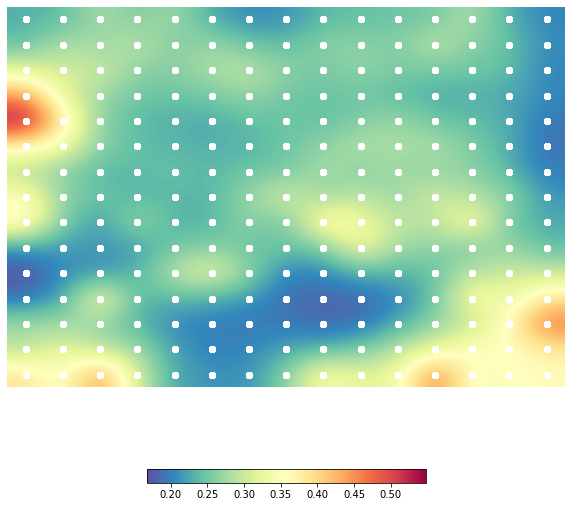

CPU times: user 1min 36s, sys: 107 ms, total: 1min 36s
Wall time: 49.5 s


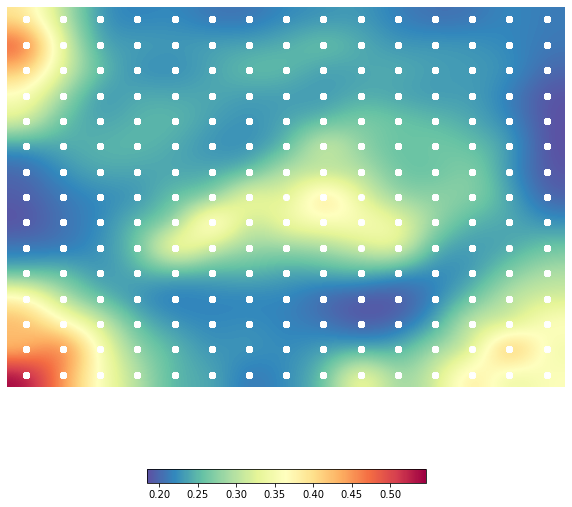

CPU times: user 1min 33s, sys: 136 ms, total: 1min 33s
Wall time: 47.9 s


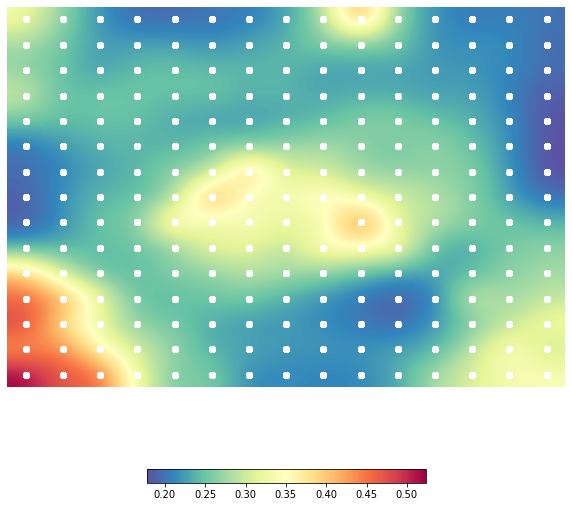

CPU times: user 1min 30s, sys: 167 ms, total: 1min 31s
Wall time: 46.8 s


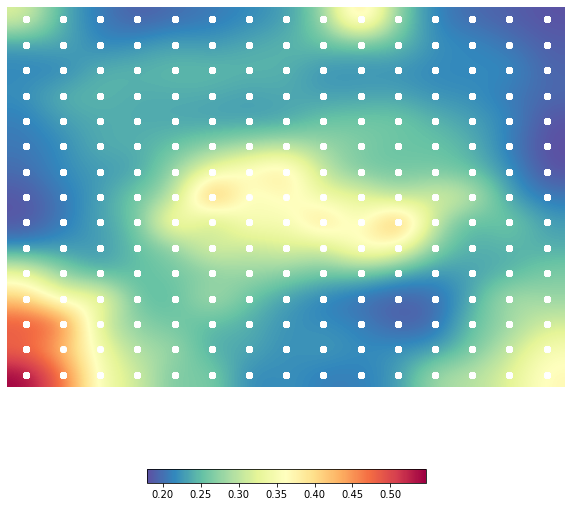

CPU times: user 1min 30s, sys: 133 ms, total: 1min 30s
Wall time: 46.4 s


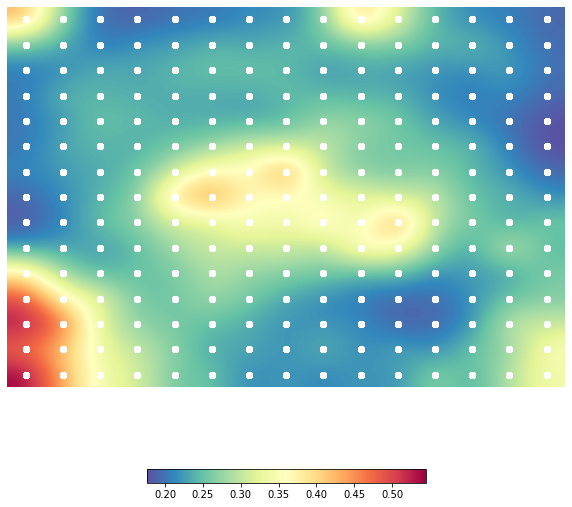

CPU times: user 1min 29s, sys: 134 ms, total: 1min 29s
Wall time: 46.1 s


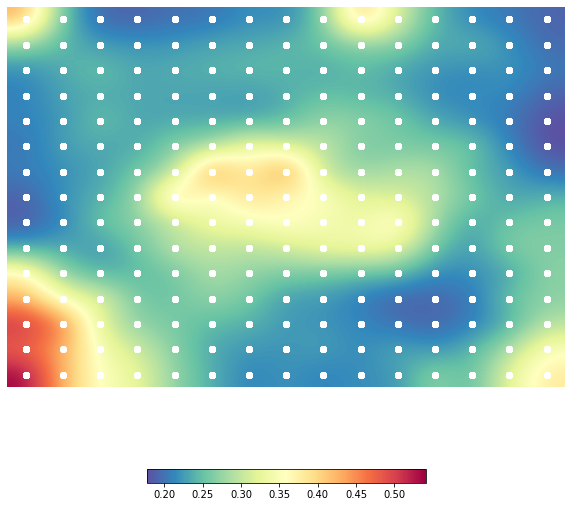

CPU times: user 1min 28s, sys: 140 ms, total: 1min 28s
Wall time: 45.3 s


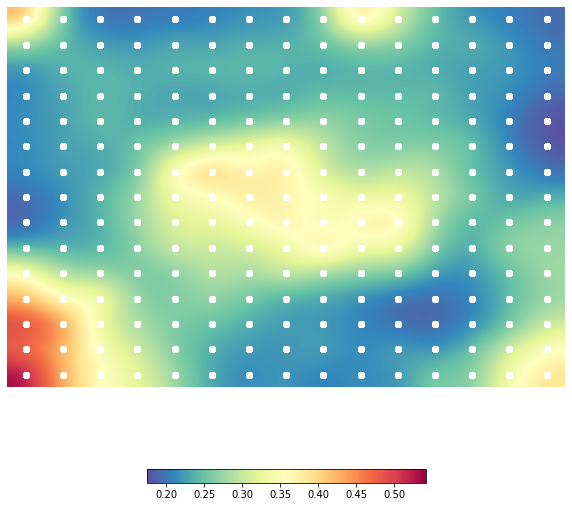

CPU times: user 1min 27s, sys: 126 ms, total: 1min 27s
Wall time: 45 s


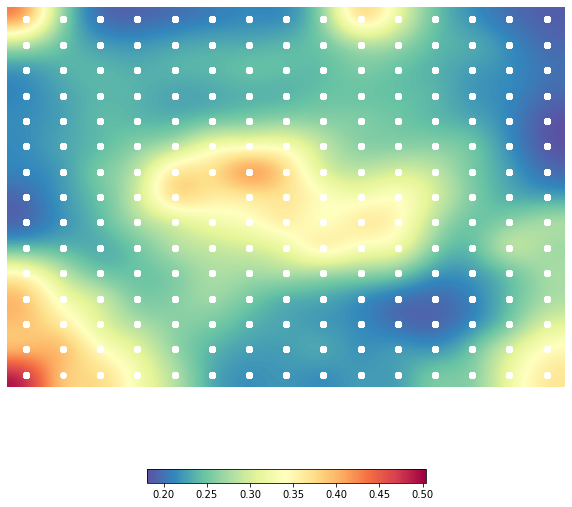

CPU times: user 1min 27s, sys: 102 ms, total: 1min 27s
Wall time: 45.1 s


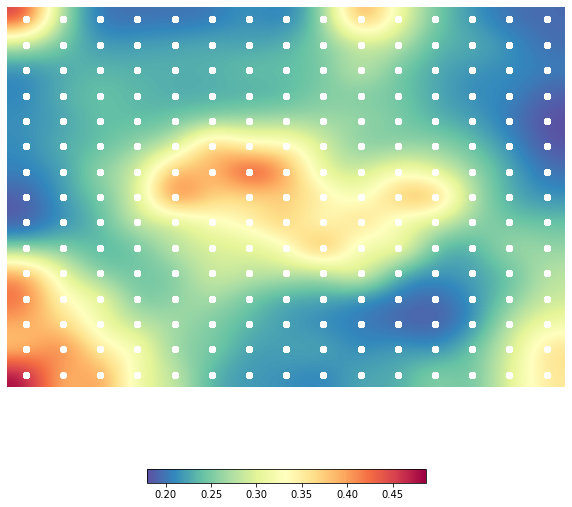

CPU times: user 1min 27s, sys: 138 ms, total: 1min 28s
Wall time: 45.1 s


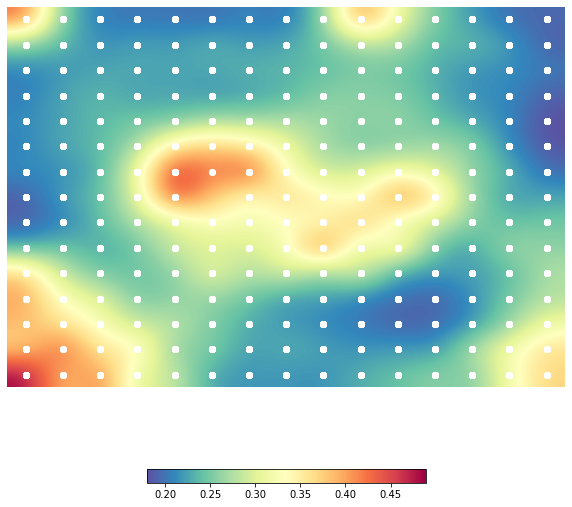

CPU times: user 1min 26s, sys: 130 ms, total: 1min 26s
Wall time: 44.5 s


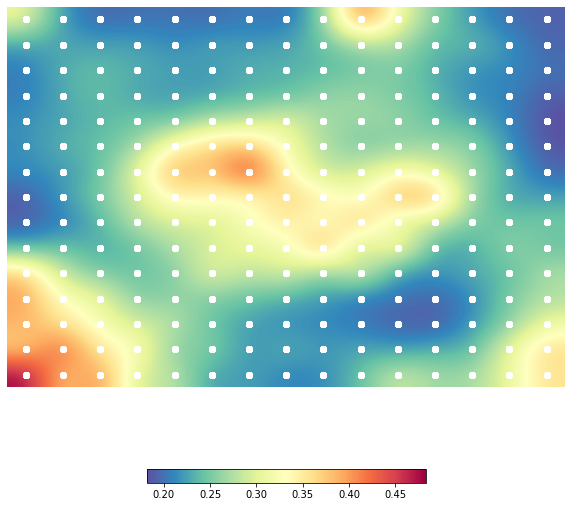

CPU times: user 1min 26s, sys: 137 ms, total: 1min 26s
Wall time: 44.5 s


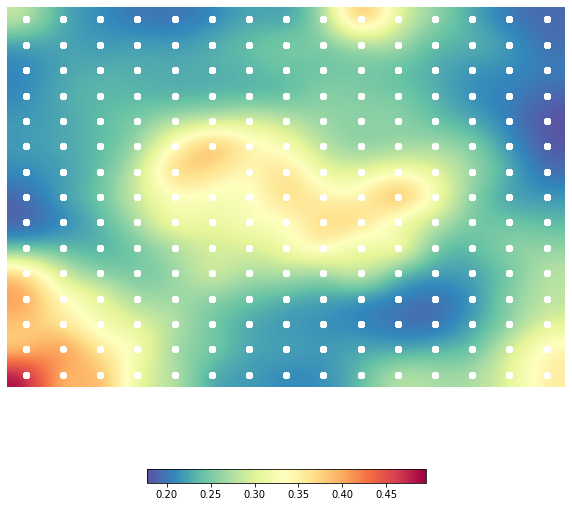

CPU times: user 1min 27s, sys: 147 ms, total: 1min 27s
Wall time: 44.9 s


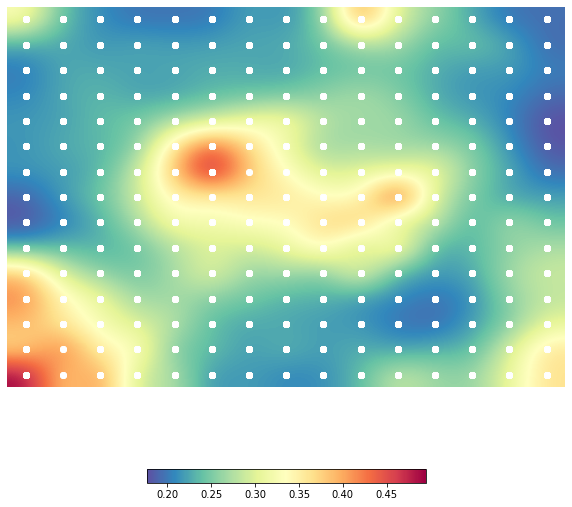

CPU times: user 1min 26s, sys: 134 ms, total: 1min 26s
Wall time: 44.5 s


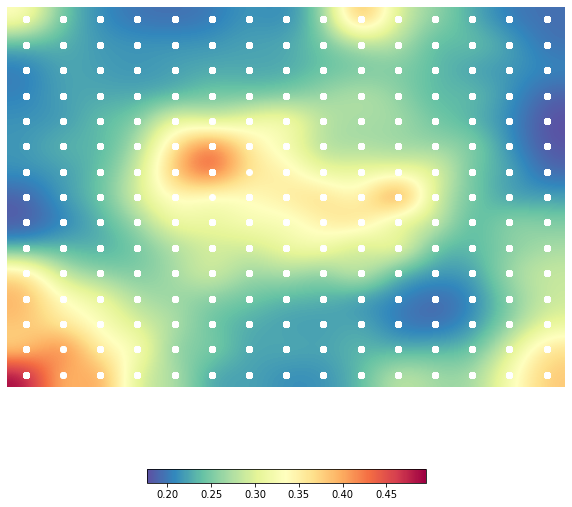

CPU times: user 1min 26s, sys: 121 ms, total: 1min 26s
Wall time: 44.2 s


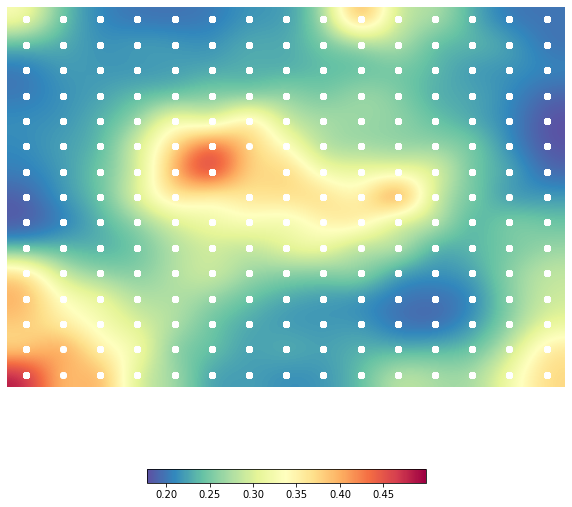

CPU times: user 1min 25s, sys: 135 ms, total: 1min 25s
Wall time: 44.1 s


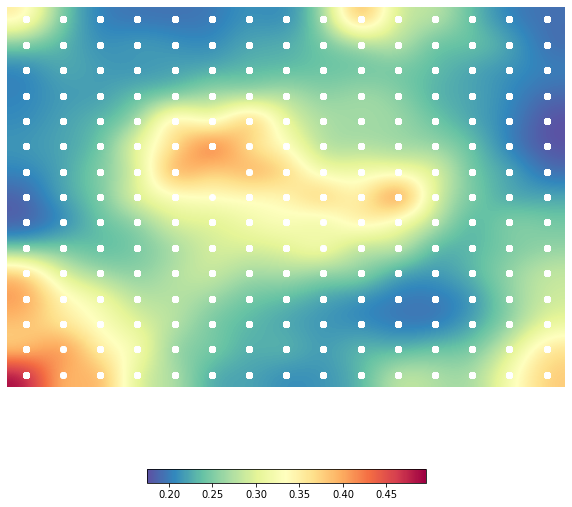

CPU times: user 1min 27s, sys: 127 ms, total: 1min 27s
Wall time: 44.8 s


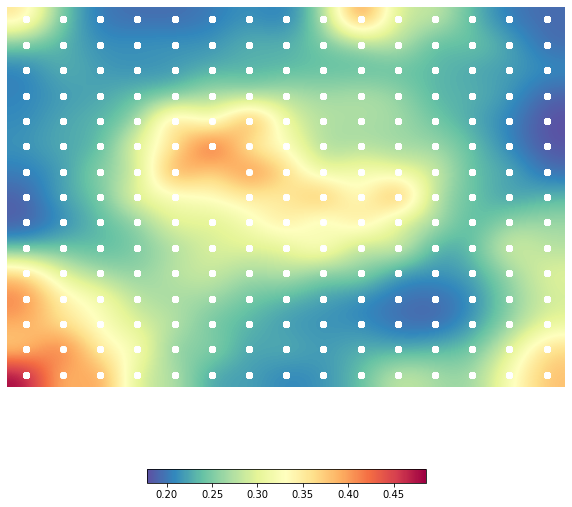

CPU times: user 1min 26s, sys: 133 ms, total: 1min 26s
Wall time: 44.5 s


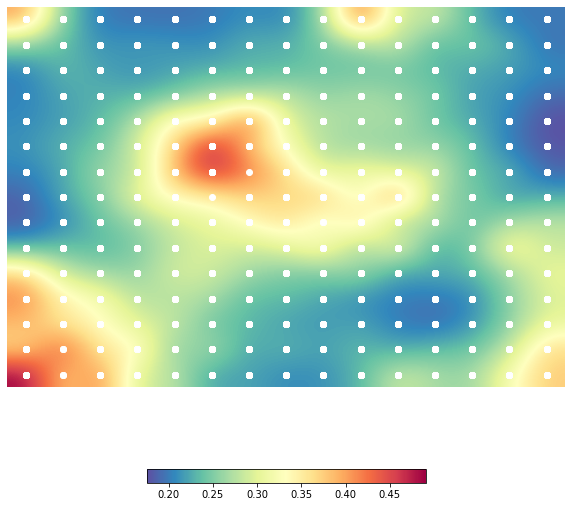

CPU times: user 1min 26s, sys: 114 ms, total: 1min 26s
Wall time: 44.5 s


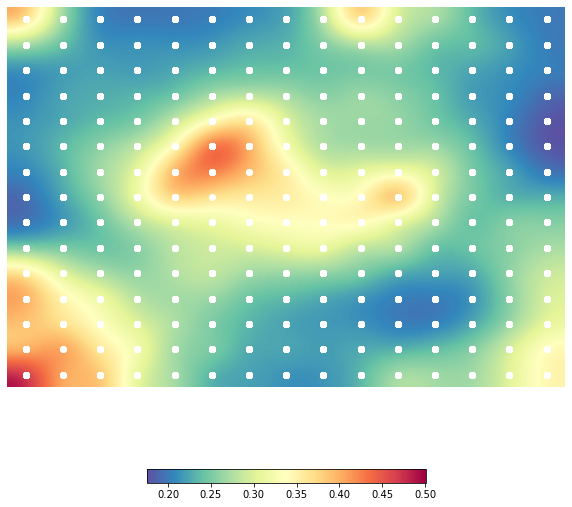

CPU times: user 1min 26s, sys: 153 ms, total: 1min 26s
Wall time: 44.5 s


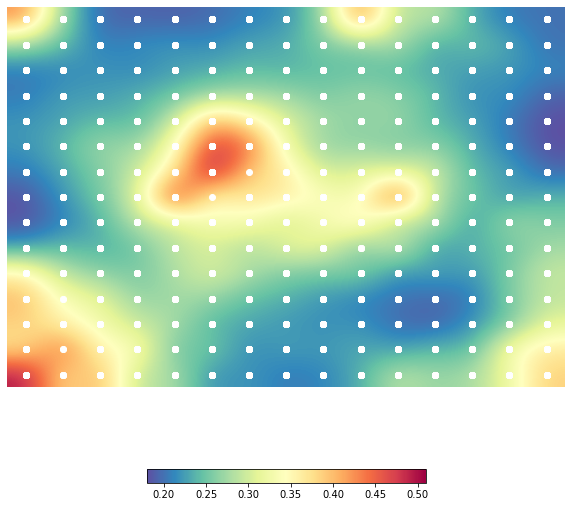

CPU times: user 1min 26s, sys: 124 ms, total: 1min 26s
Wall time: 44.5 s


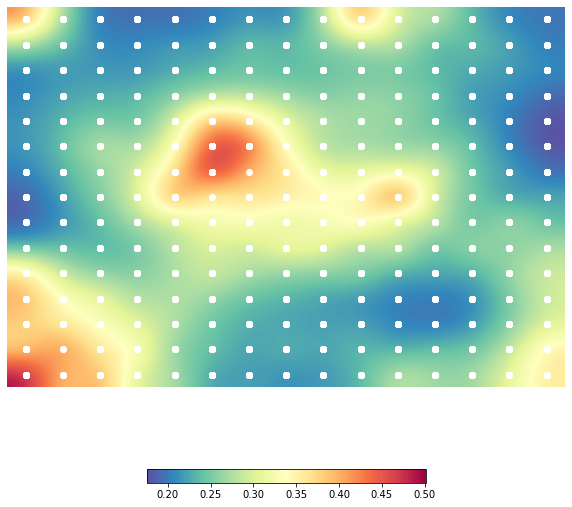

CPU times: user 1min 26s, sys: 139 ms, total: 1min 26s
Wall time: 44.5 s


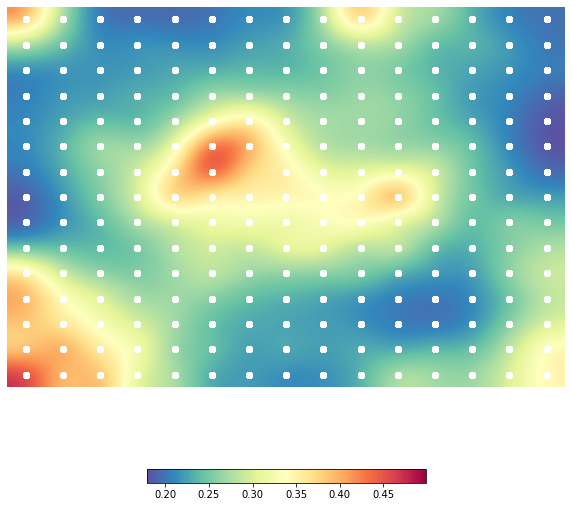

CPU times: user 1min 25s, sys: 129 ms, total: 1min 26s
Wall time: 44.1 s


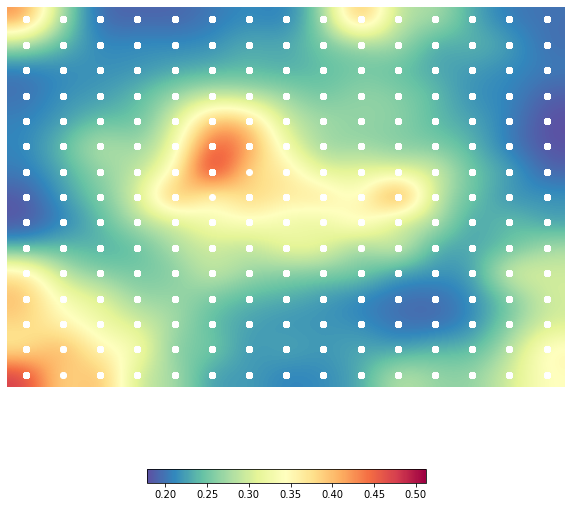

CPU times: user 1min 26s, sys: 116 ms, total: 1min 26s
Wall time: 44.6 s


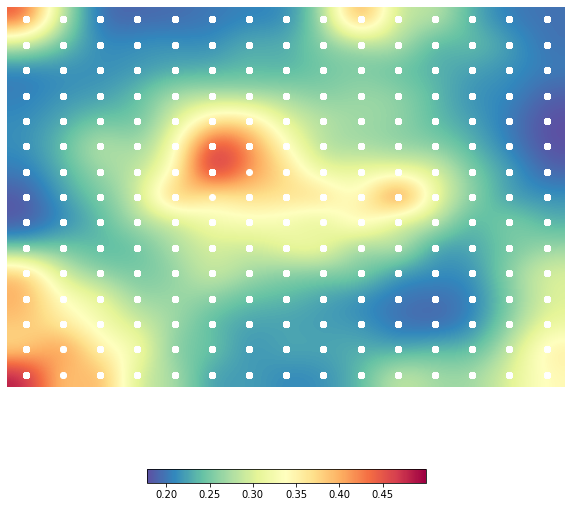

CPU times: user 1min 26s, sys: 122 ms, total: 1min 26s
Wall time: 44.4 s


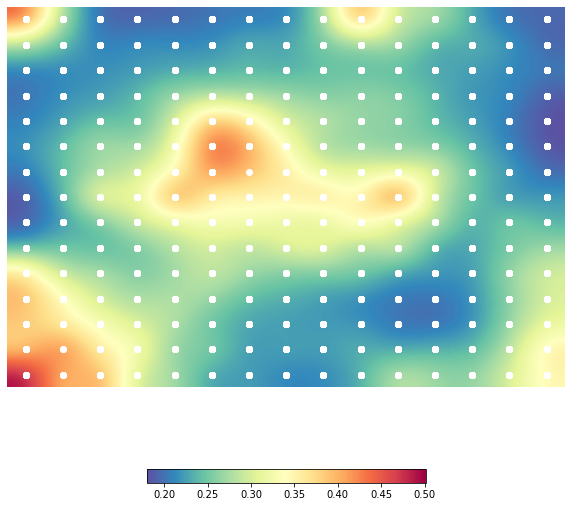

CPU times: user 1min 26s, sys: 139 ms, total: 1min 26s
Wall time: 44.5 s


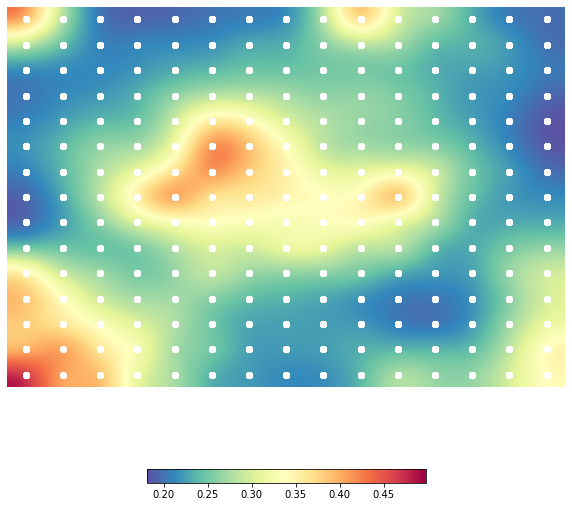

CPU times: user 1min 25s, sys: 115 ms, total: 1min 25s
Wall time: 44.1 s


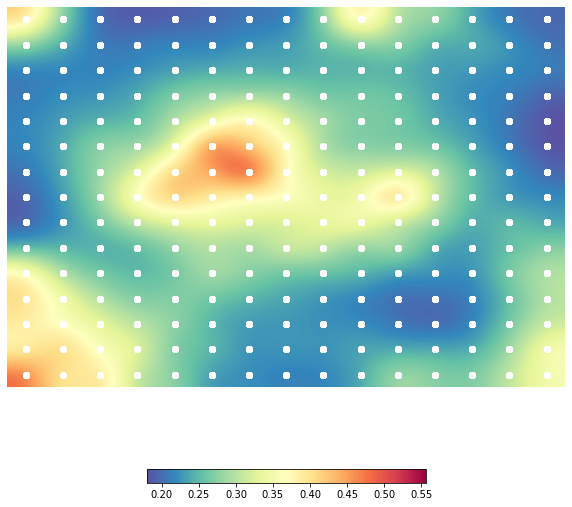

CPU times: user 1min 26s, sys: 109 ms, total: 1min 26s
Wall time: 44.3 s


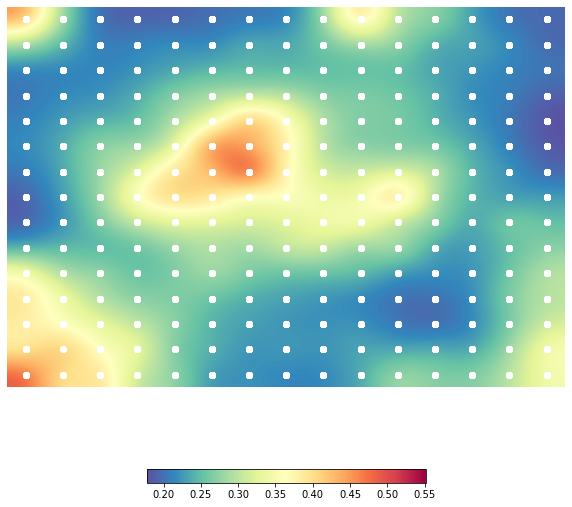

CPU times: user 1min 26s, sys: 124 ms, total: 1min 26s
Wall time: 44.6 s


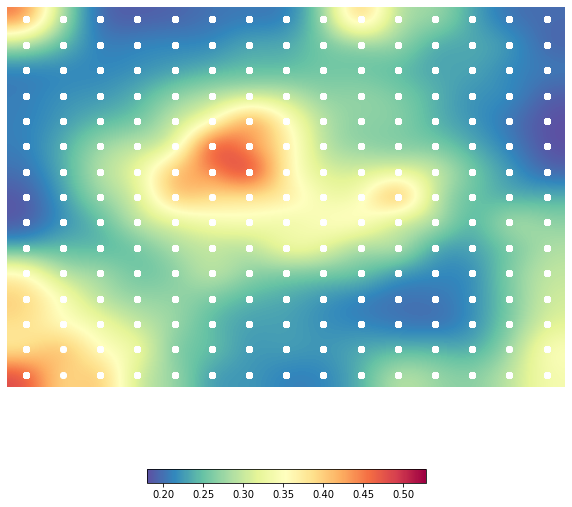

CPU times: user 1min 25s, sys: 127 ms, total: 1min 25s
Wall time: 44.1 s


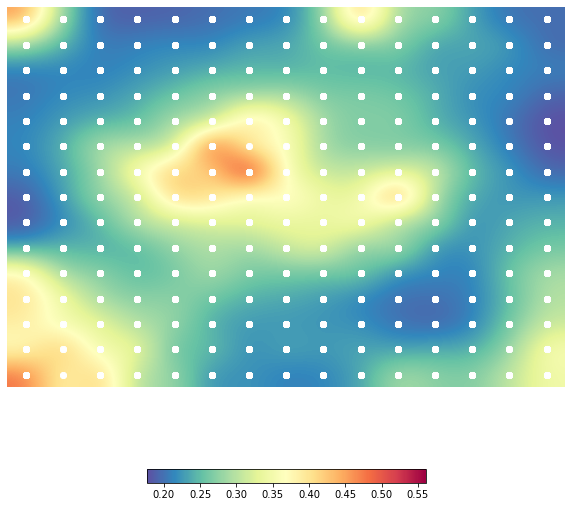

CPU times: user 1min 26s, sys: 121 ms, total: 1min 26s
Wall time: 44.2 s


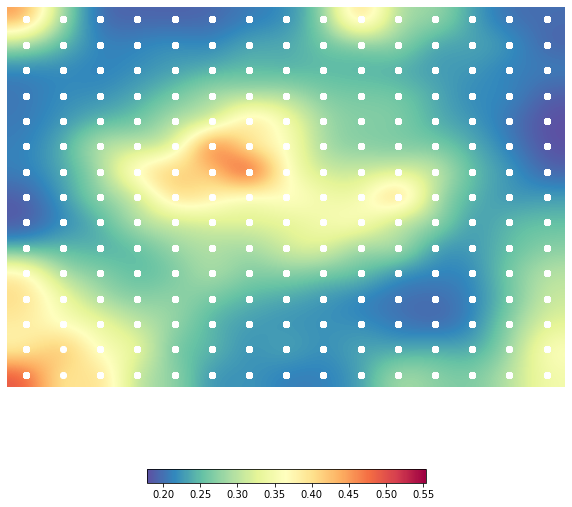

CPU times: user 1min 25s, sys: 128 ms, total: 1min 25s
Wall time: 44 s


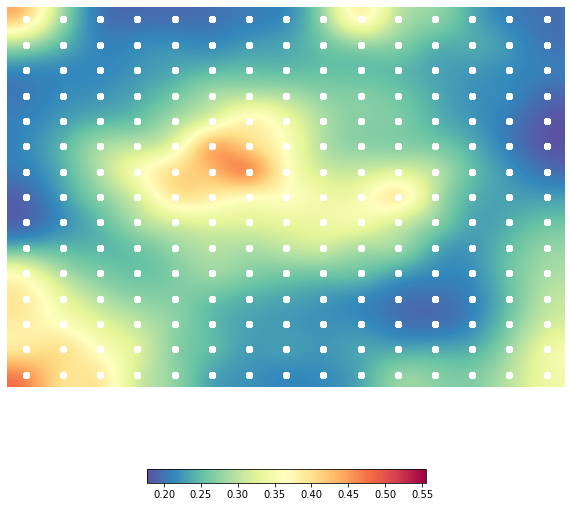

CPU times: user 1min 26s, sys: 139 ms, total: 1min 27s
Wall time: 44.6 s


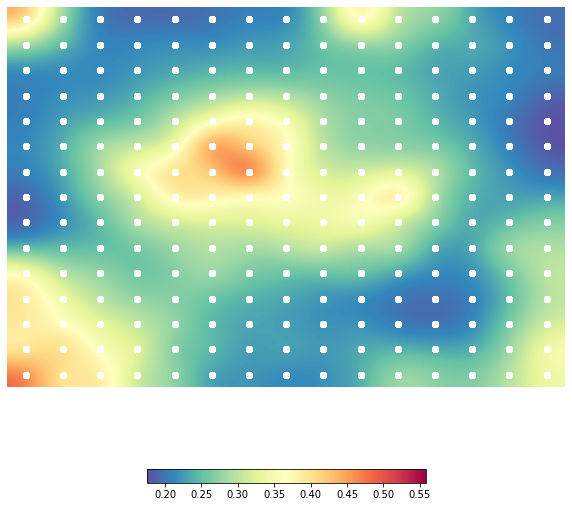

CPU times: user 1min 26s, sys: 155 ms, total: 1min 26s
Wall time: 44.2 s


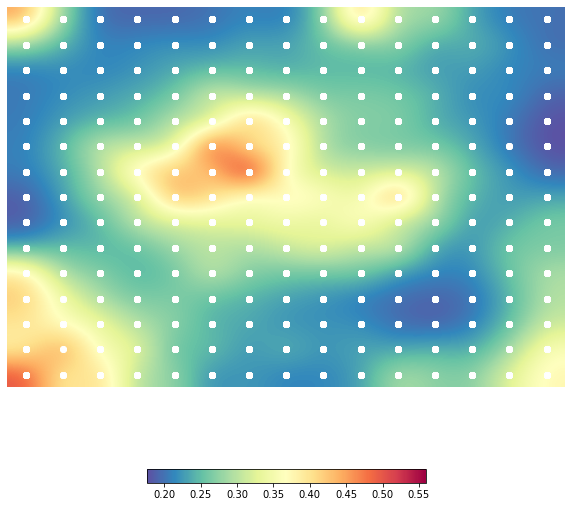

CPU times: user 1min 25s, sys: 213 ms, total: 1min 25s
Wall time: 44 s


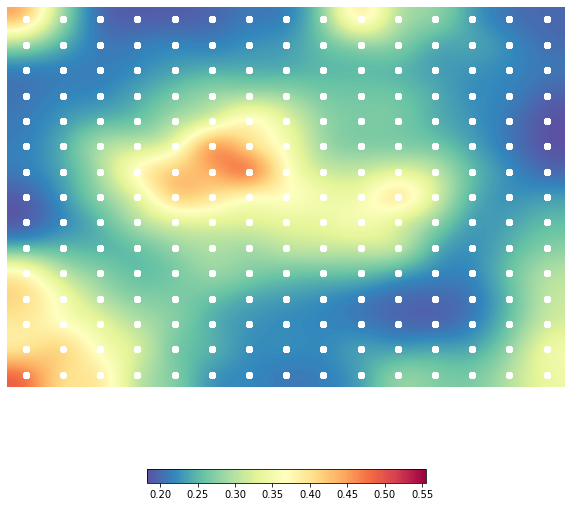

CPU times: user 1min 25s, sys: 151 ms, total: 1min 25s
Wall time: 44 s


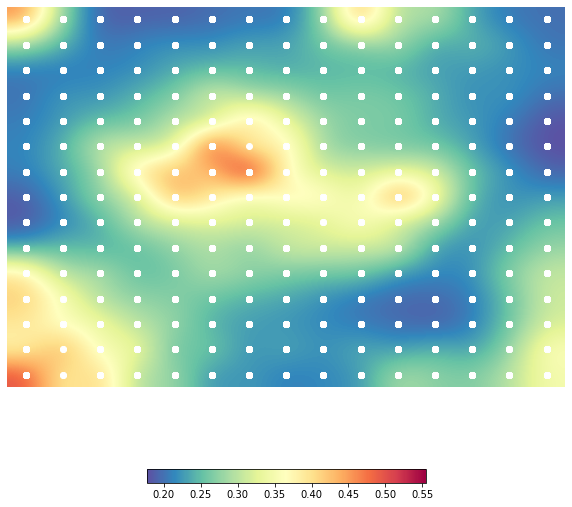

CPU times: user 1min 25s, sys: 183 ms, total: 1min 26s
Wall time: 44.2 s


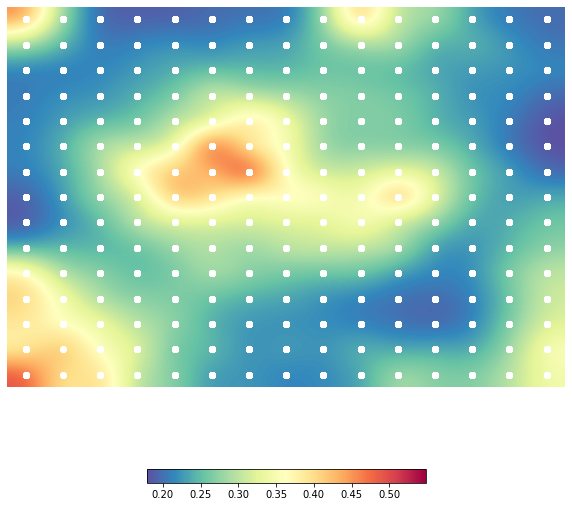

CPU times: user 1min 26s, sys: 136 ms, total: 1min 26s
Wall time: 44.6 s


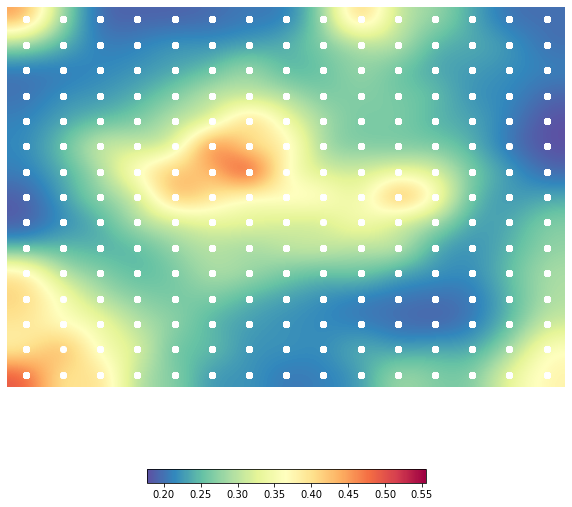

CPU times: user 1min 24s, sys: 157 ms, total: 1min 24s
Wall time: 43.4 s


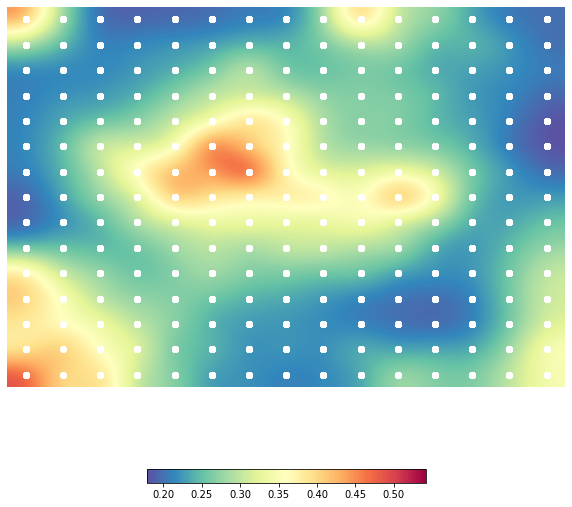

CPU times: user 1min 27s, sys: 144 ms, total: 1min 27s
Wall time: 44.8 s


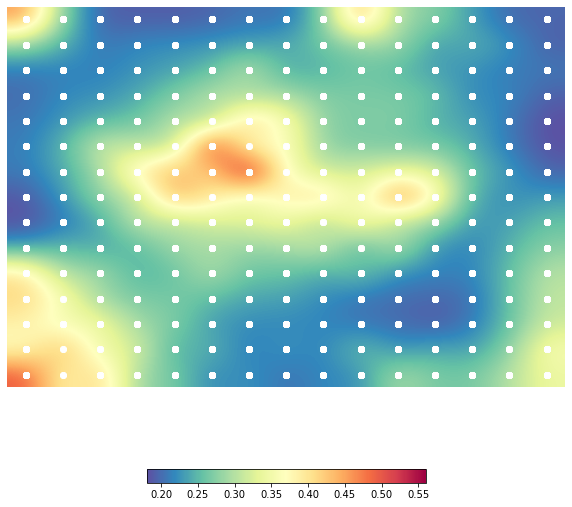

CPU times: user 1min 26s, sys: 139 ms, total: 1min 26s
Wall time: 44.4 s


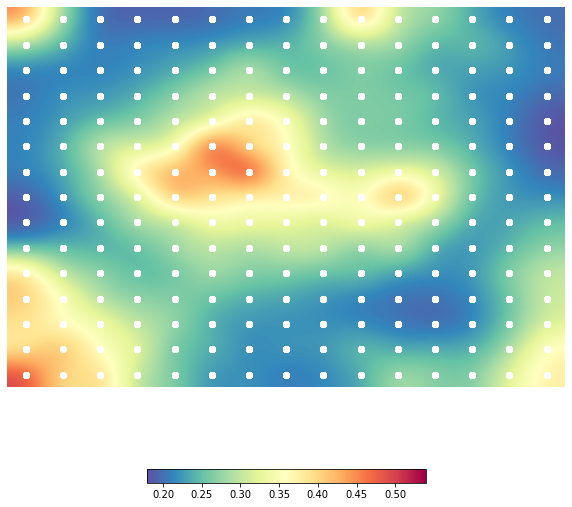

CPU times: user 1min 26s, sys: 133 ms, total: 1min 26s
Wall time: 44.6 s


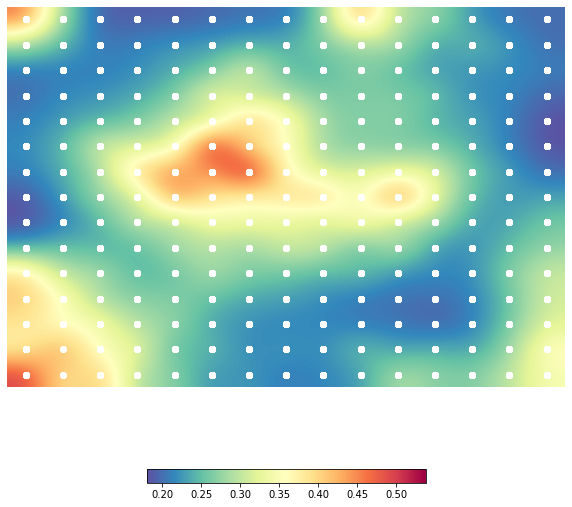

CPU times: user 1min 25s, sys: 146 ms, total: 1min 25s
Wall time: 43.9 s


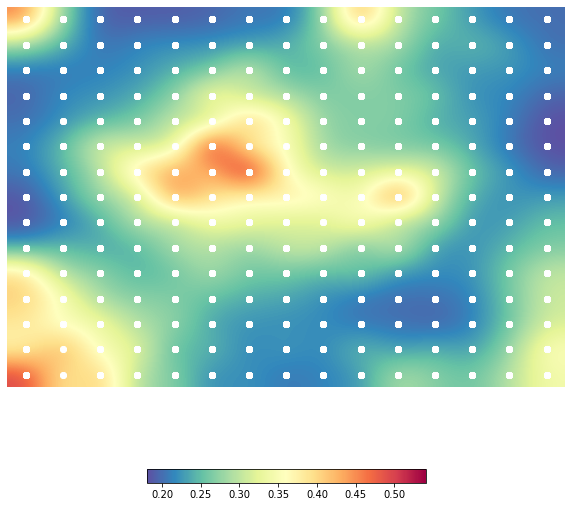

CPU times: user 1min 25s, sys: 155 ms, total: 1min 25s
Wall time: 44.1 s


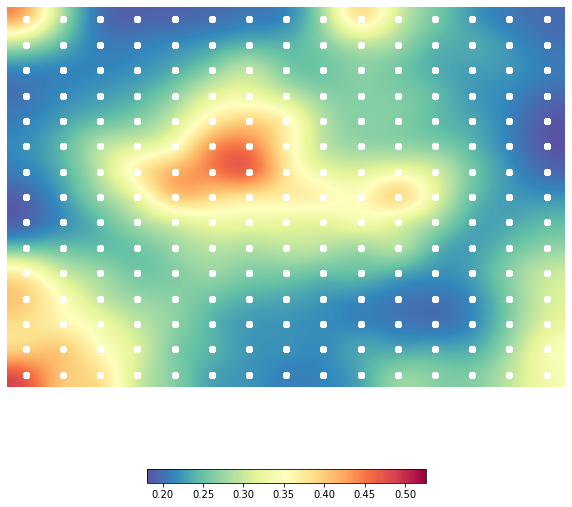

CPU times: user 1min 26s, sys: 123 ms, total: 1min 26s
Wall time: 44.5 s


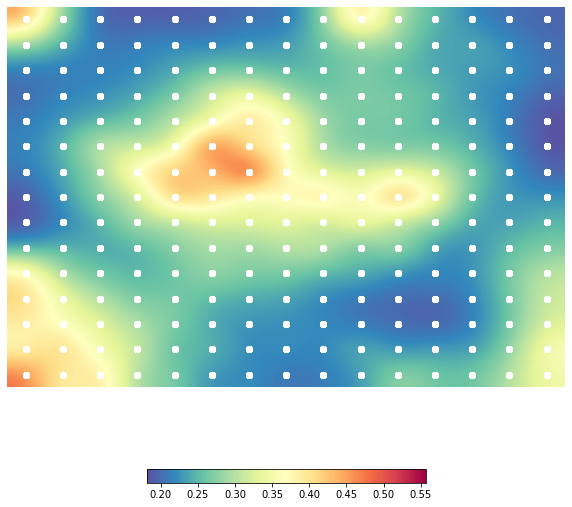

CPU times: user 1min 26s, sys: 165 ms, total: 1min 26s
Wall time: 44.4 s


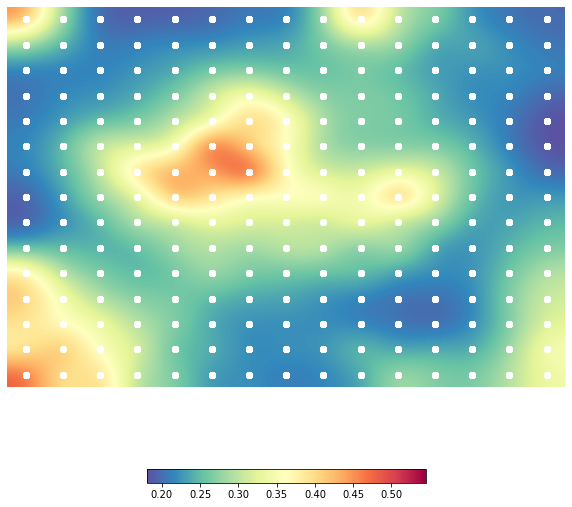

CPU times: user 1min 27s, sys: 137 ms, total: 1min 27s
Wall time: 45 s


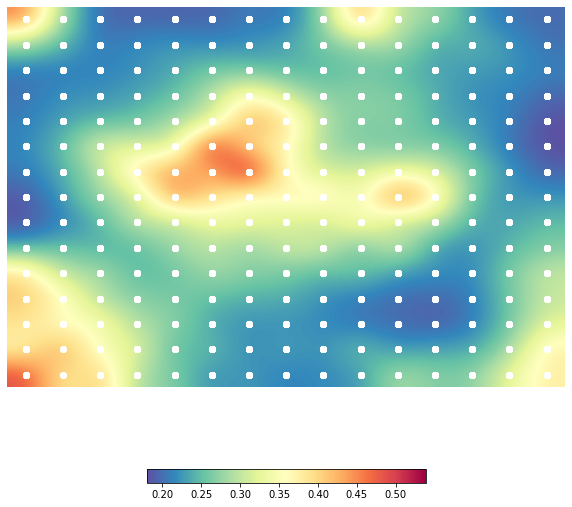

CPU times: user 1min 28s, sys: 130 ms, total: 1min 29s
Wall time: 45.7 s


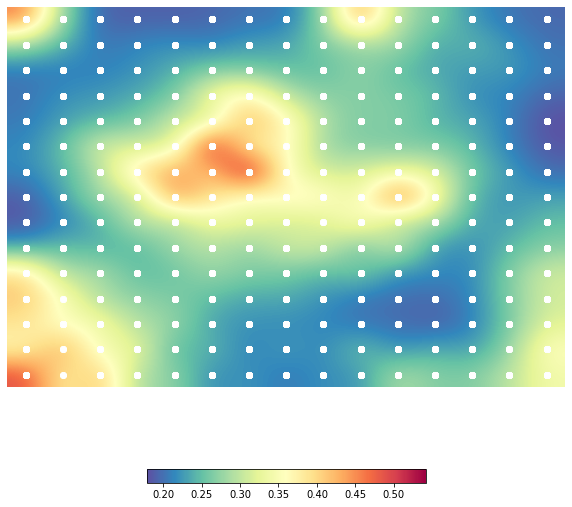

CPU times: user 1min 29s, sys: 148 ms, total: 1min 29s
Wall time: 46 s


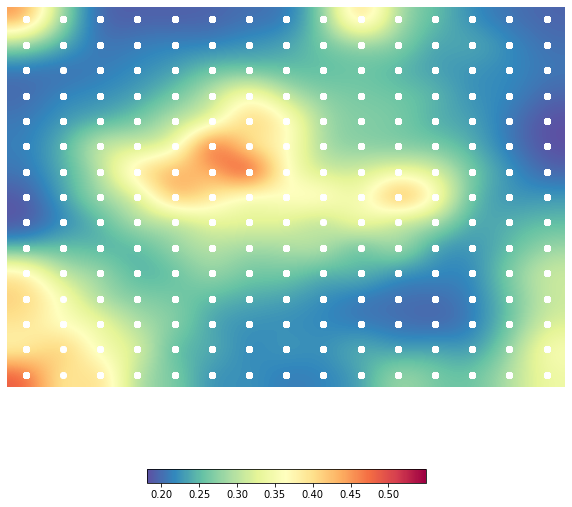

CPU times: user 1min 29s, sys: 221 ms, total: 1min 29s
Wall time: 46.2 s


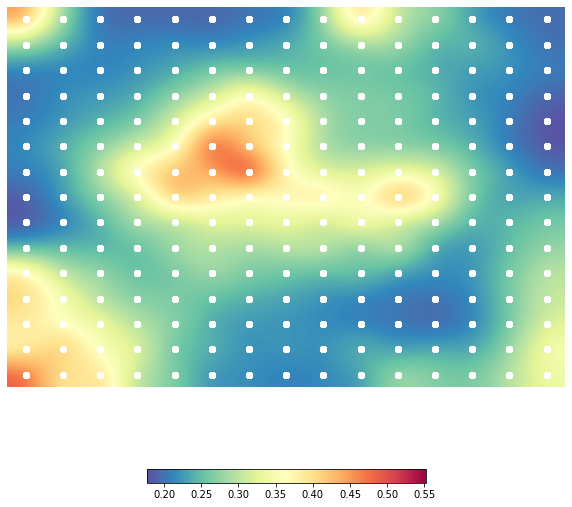

CPU times: user 1min 31s, sys: 142 ms, total: 1min 31s
Wall time: 47.2 s


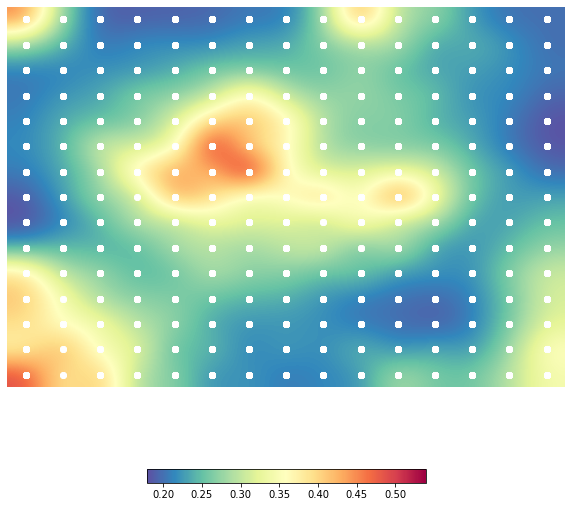

CPU times: user 1min 34s, sys: 117 ms, total: 1min 34s
Wall time: 48.8 s


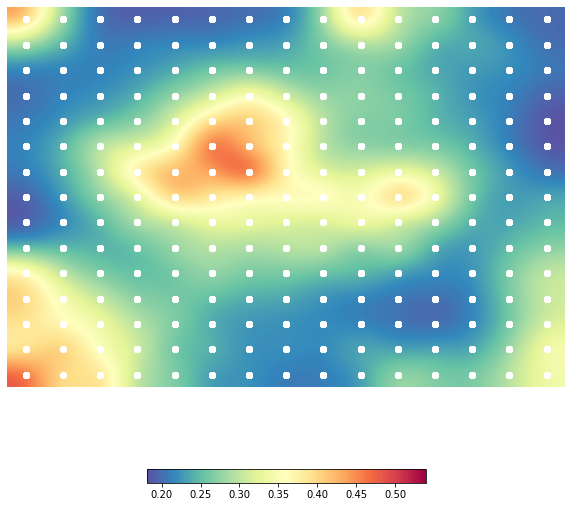

CPU times: user 1min 34s, sys: 200 ms, total: 1min 34s
Wall time: 48.6 s


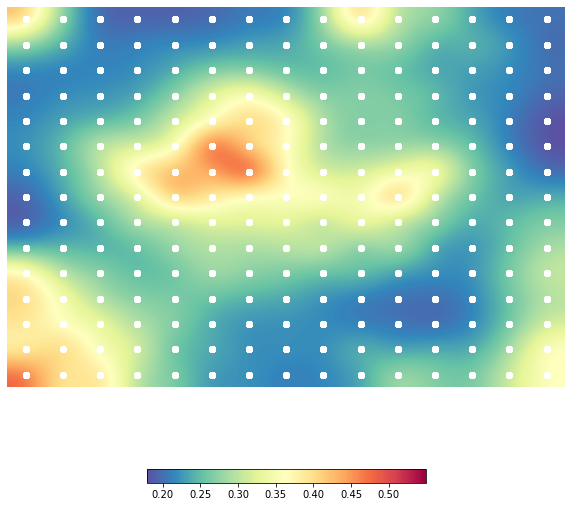

CPU times: user 1min 34s, sys: 170 ms, total: 1min 34s
Wall time: 48.6 s


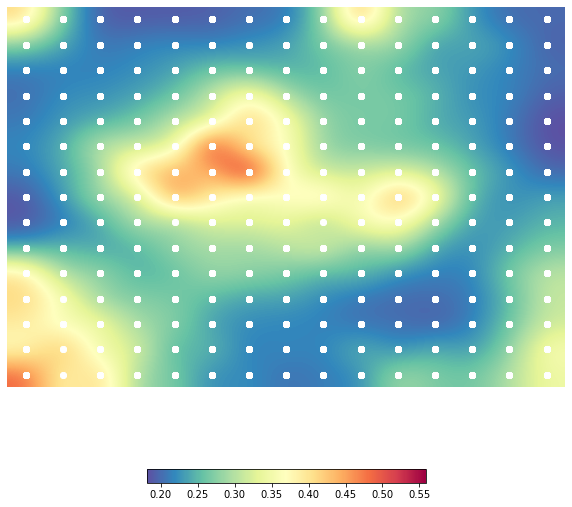

CPU times: user 1min 33s, sys: 149 ms, total: 1min 33s
Wall time: 48.1 s


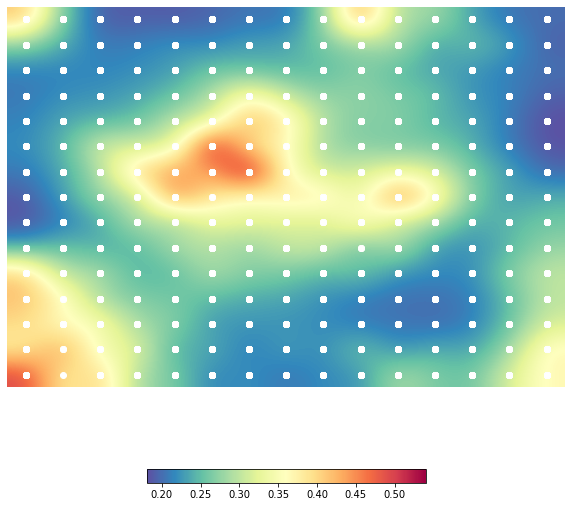

CPU times: user 1min 31s, sys: 169 ms, total: 1min 32s
Wall time: 47.3 s


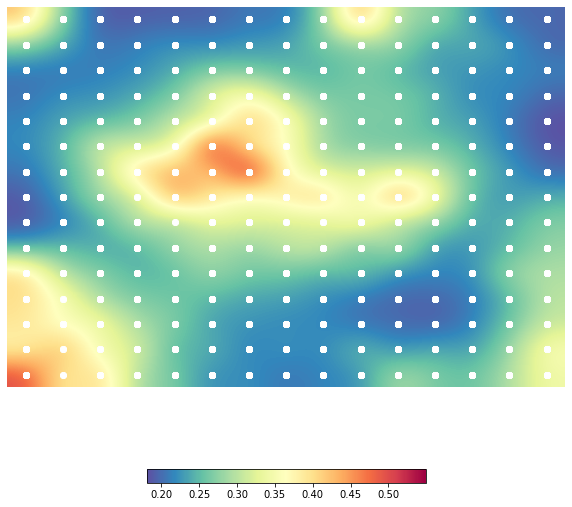

CPU times: user 1min 30s, sys: 144 ms, total: 1min 30s
Wall time: 46.6 s


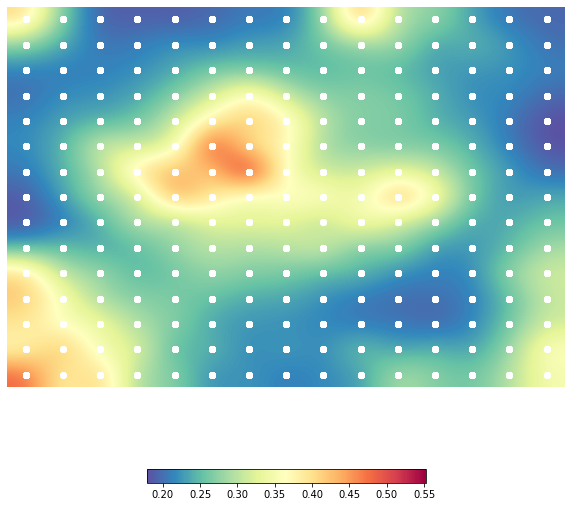

CPU times: user 1min 30s, sys: 191 ms, total: 1min 30s
Wall time: 46.6 s


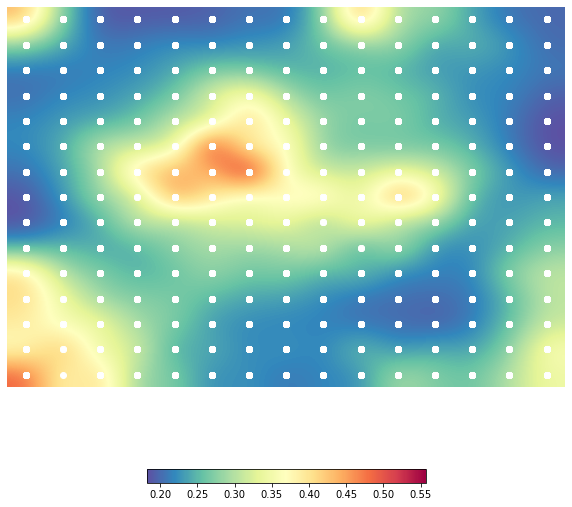

CPU times: user 1min 30s, sys: 190 ms, total: 1min 31s
Wall time: 46.8 s


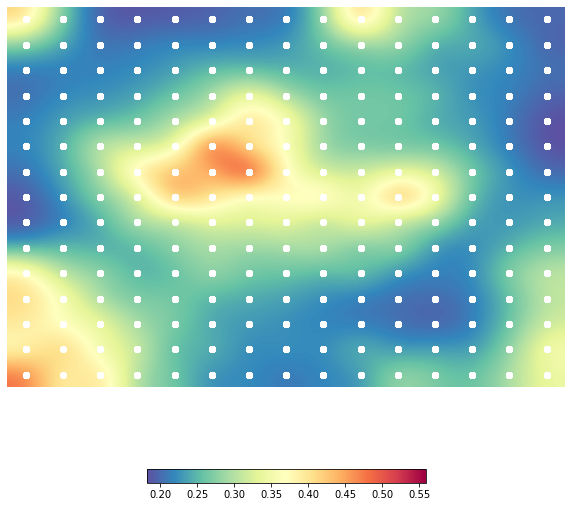

CPU times: user 1min 30s, sys: 130 ms, total: 1min 30s
Wall time: 46.6 s


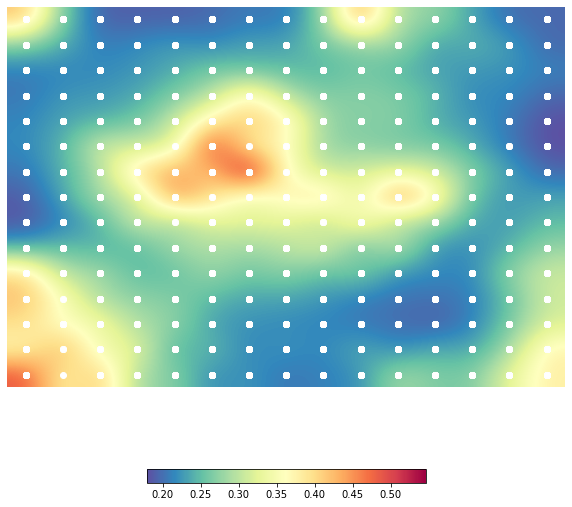

CPU times: user 1min 31s, sys: 146 ms, total: 1min 31s
Wall time: 47.1 s


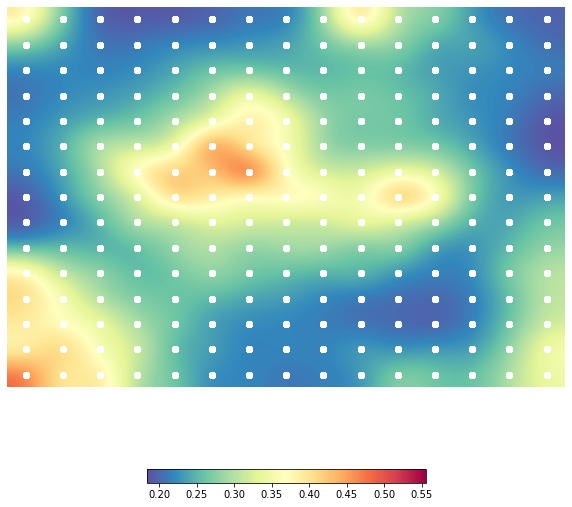

CPU times: user 1min 32s, sys: 183 ms, total: 1min 32s
Wall time: 47.4 s


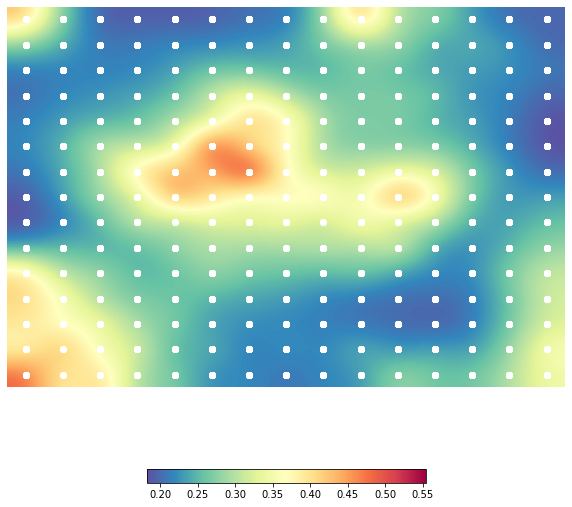

CPU times: user 1min 31s, sys: 123 ms, total: 1min 31s
Wall time: 47.3 s


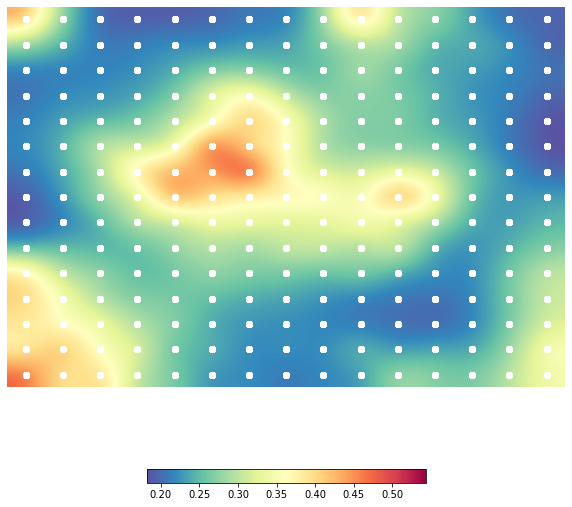

CPU times: user 1min 32s, sys: 134 ms, total: 1min 32s
Wall time: 47.5 s


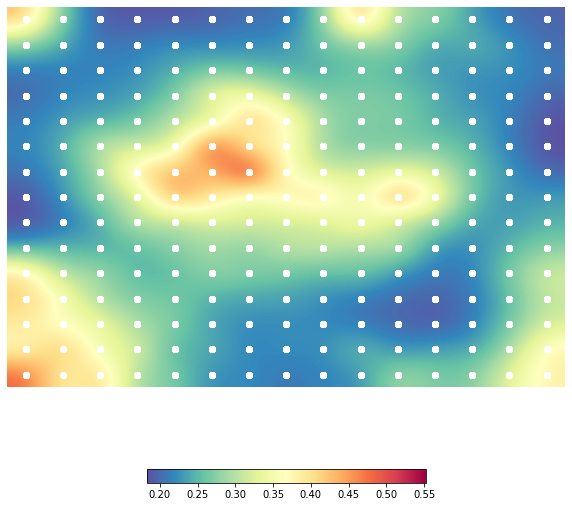

CPU times: user 1min 33s, sys: 127 ms, total: 1min 33s
Wall time: 48.2 s


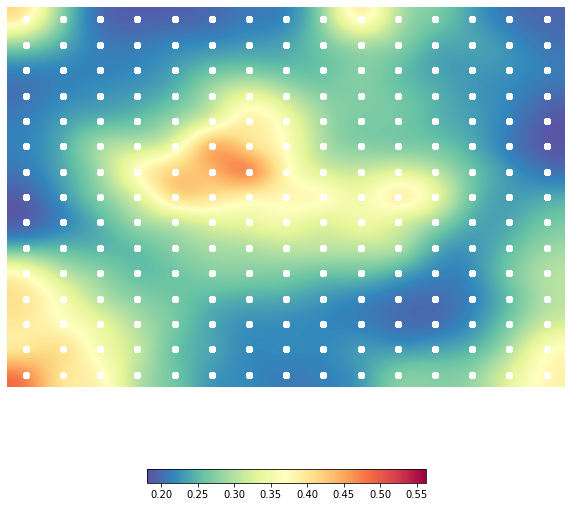

CPU times: user 1min 36s, sys: 125 ms, total: 1min 36s
Wall time: 49.7 s


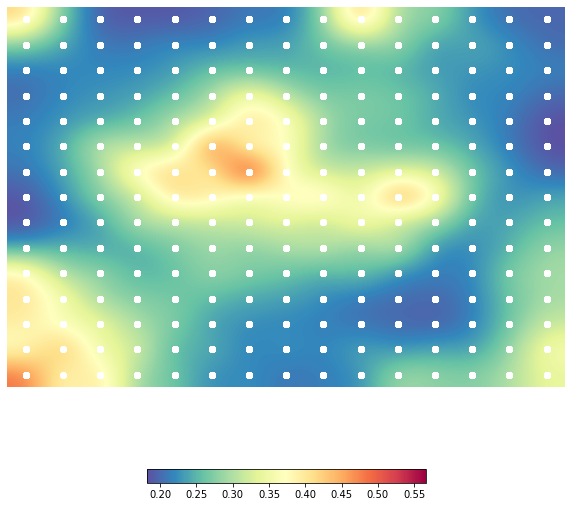

CPU times: user 1min 35s, sys: 129 ms, total: 1min 35s
Wall time: 49.3 s


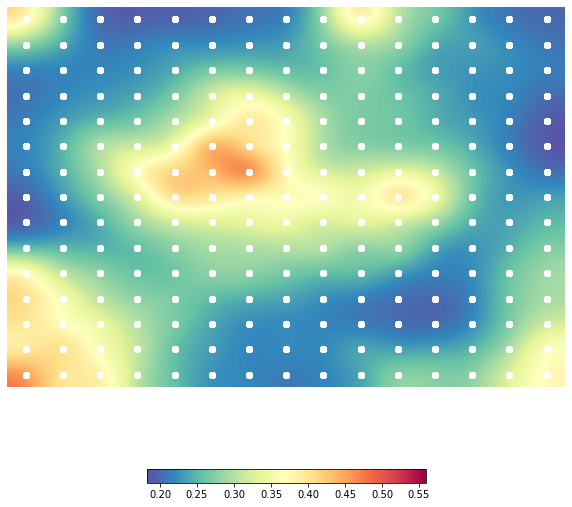

CPU times: user 1min 37s, sys: 131 ms, total: 1min 37s
Wall time: 49.9 s


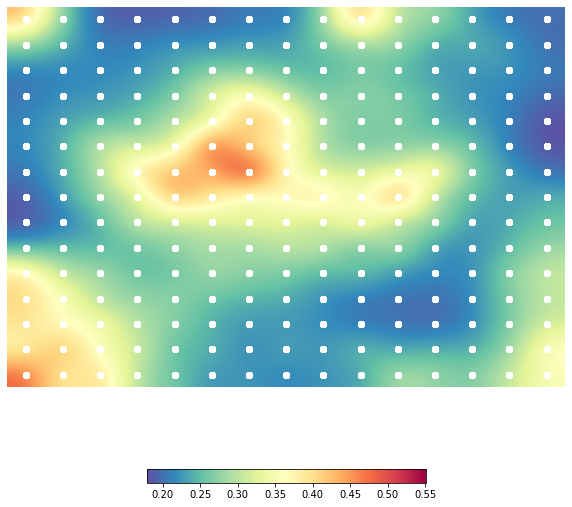

CPU times: user 1min 40s, sys: 95.9 ms, total: 1min 40s
Wall time: 51.7 s


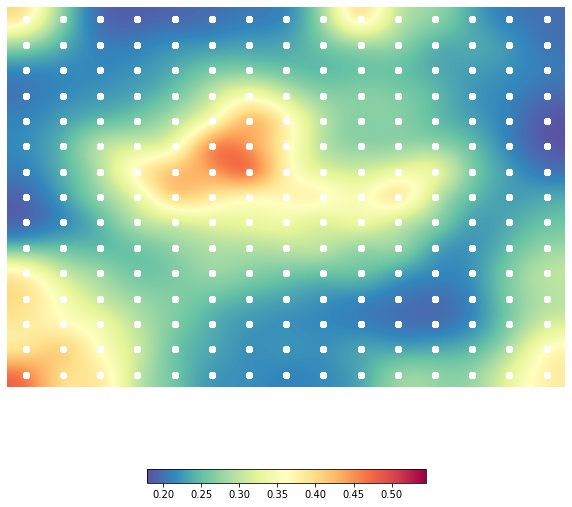

CPU times: user 1min 35s, sys: 115 ms, total: 1min 35s
Wall time: 49.3 s


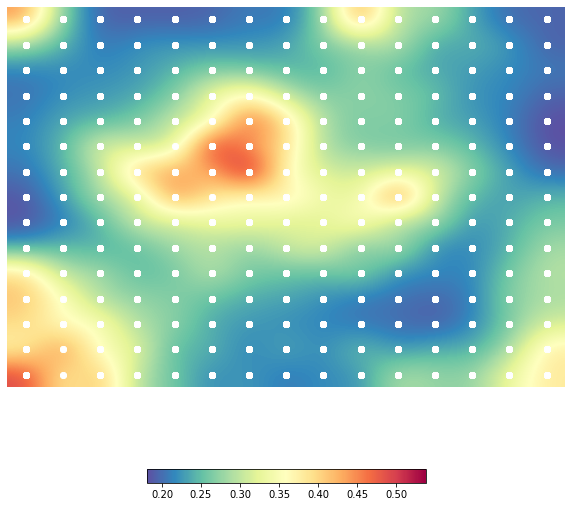

CPU times: user 1min 30s, sys: 131 ms, total: 1min 31s
Wall time: 46.7 s


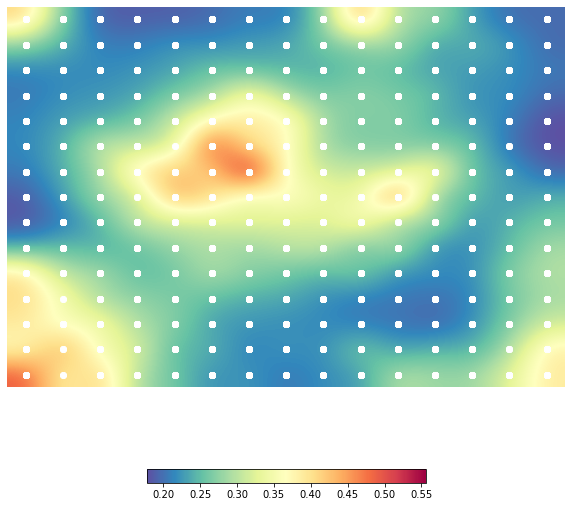

CPU times: user 1min 29s, sys: 132 ms, total: 1min 30s
Wall time: 46.2 s


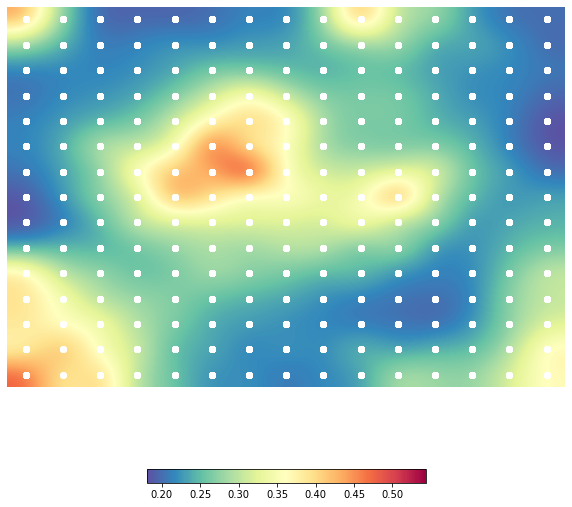

CPU times: user 1min 27s, sys: 125 ms, total: 1min 27s
Wall time: 45.1 s


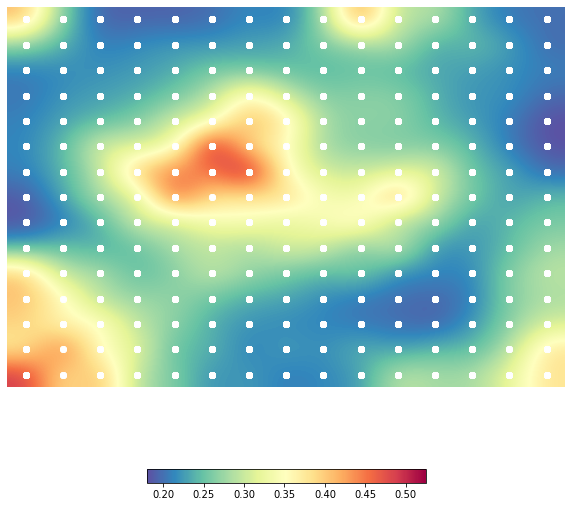

CPU times: user 1min 28s, sys: 95.9 ms, total: 1min 28s
Wall time: 45.5 s


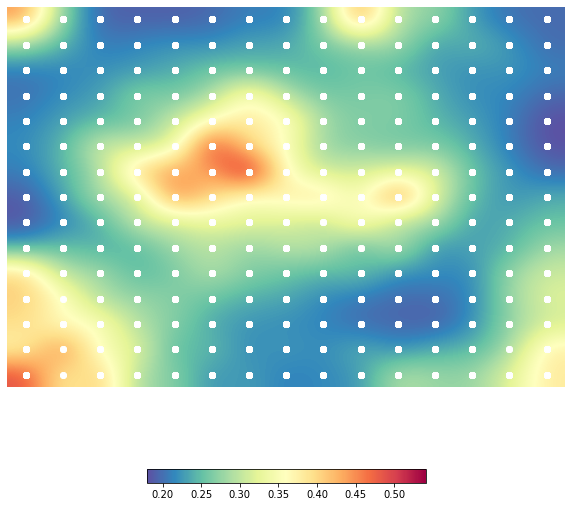

CPU times: user 1min 27s, sys: 126 ms, total: 1min 27s
Wall time: 45.1 s


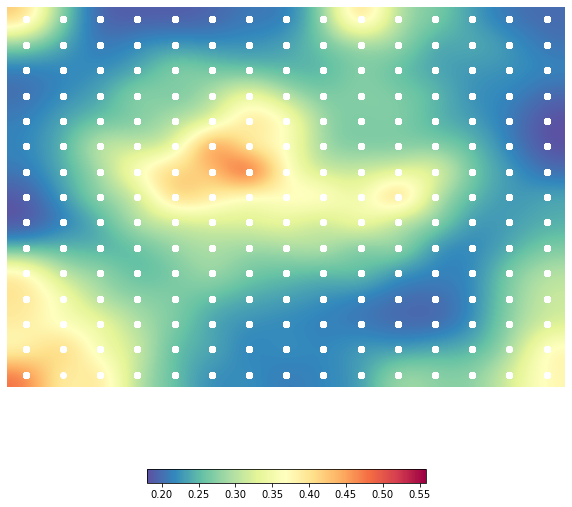

CPU times: user 1min 27s, sys: 124 ms, total: 1min 27s
Wall time: 44.8 s


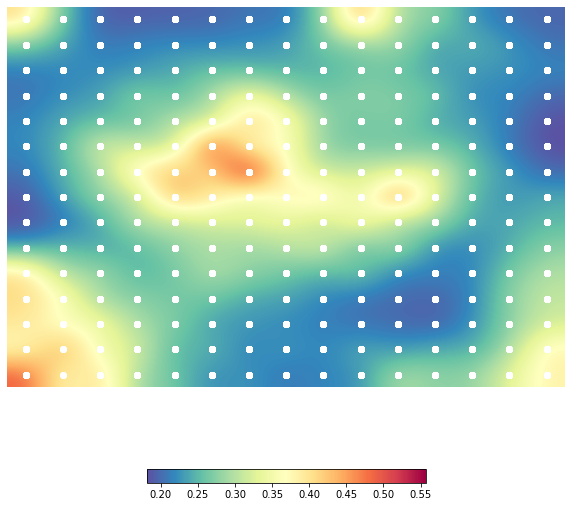

CPU times: user 1min 25s, sys: 134 ms, total: 1min 25s
Wall time: 44 s


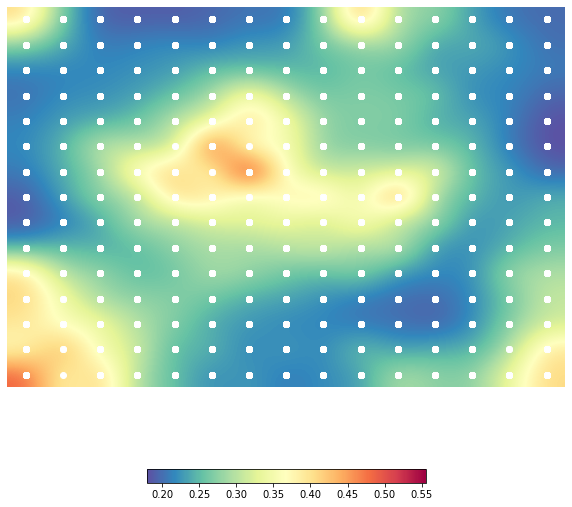

CPU times: user 1min 26s, sys: 125 ms, total: 1min 26s
Wall time: 44.5 s


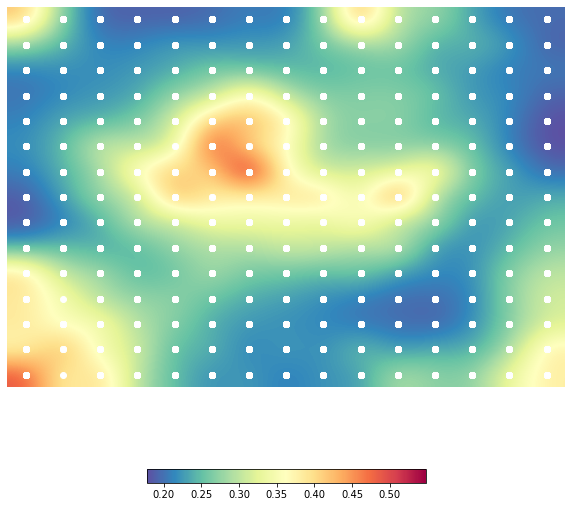

CPU times: user 1min 26s, sys: 129 ms, total: 1min 26s
Wall time: 44.4 s


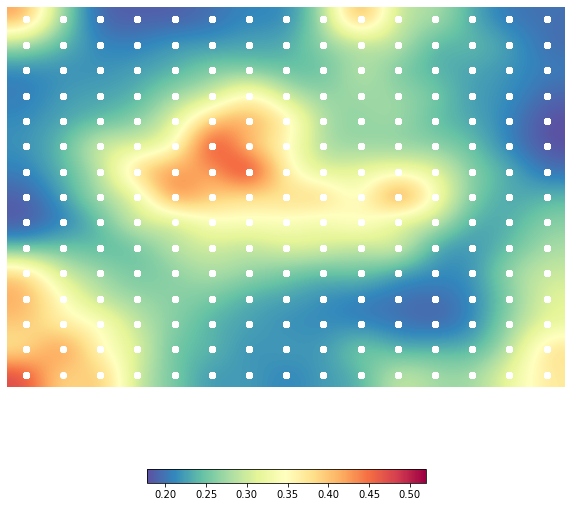

CPU times: user 1min 25s, sys: 135 ms, total: 1min 25s
Wall time: 43.7 s


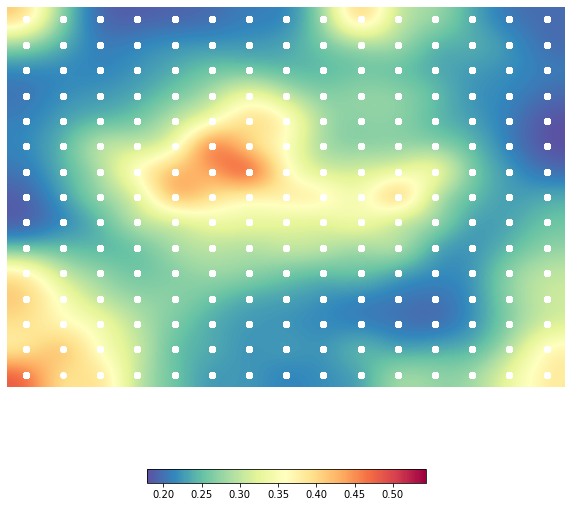

CPU times: user 1min 25s, sys: 143 ms, total: 1min 25s
Wall time: 44 s


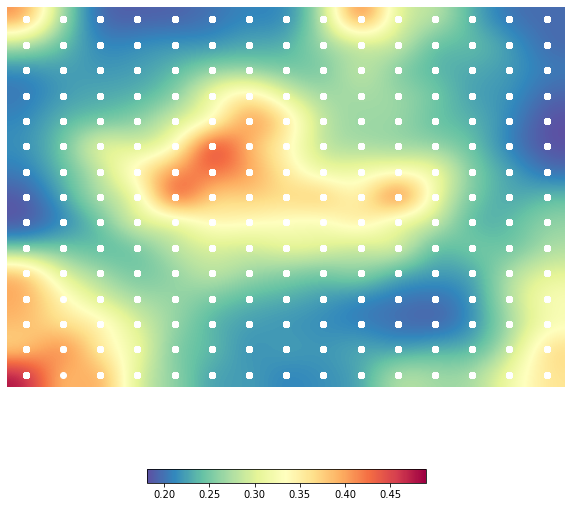

CPU times: user 1min 25s, sys: 186 ms, total: 1min 25s
Wall time: 44.1 s


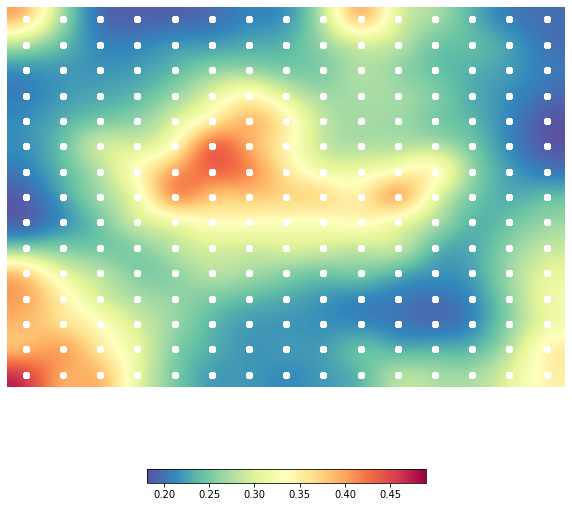

CPU times: user 1min 25s, sys: 139 ms, total: 1min 25s
Wall time: 44 s


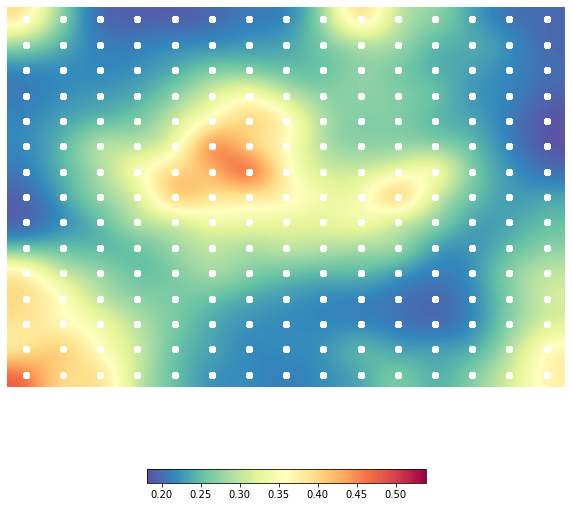

CPU times: user 1min 24s, sys: 158 ms, total: 1min 24s
Wall time: 43.6 s


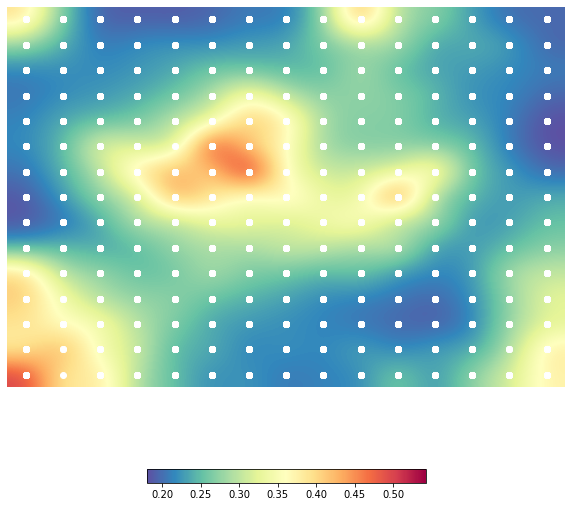

CPU times: user 1min 26s, sys: 146 ms, total: 1min 26s
Wall time: 44.3 s


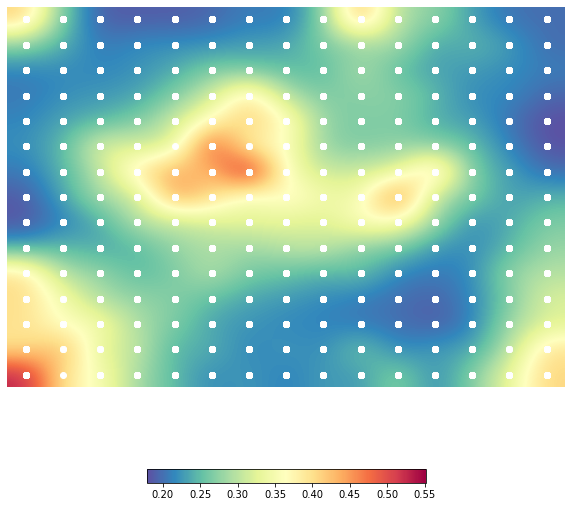

CPU times: user 1min 25s, sys: 133 ms, total: 1min 26s
Wall time: 44.1 s


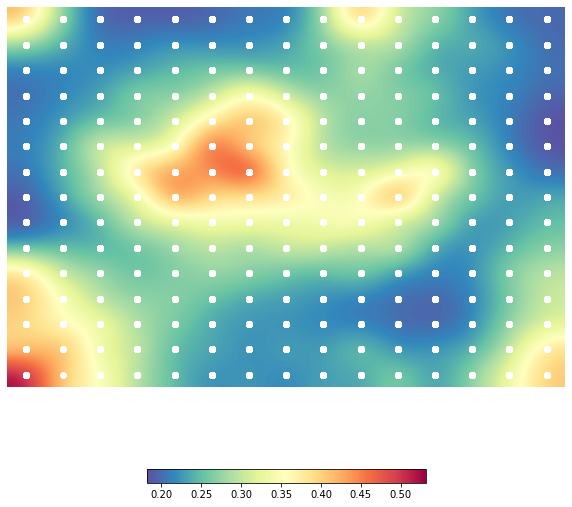

CPU times: user 1min 25s, sys: 115 ms, total: 1min 25s
Wall time: 44 s


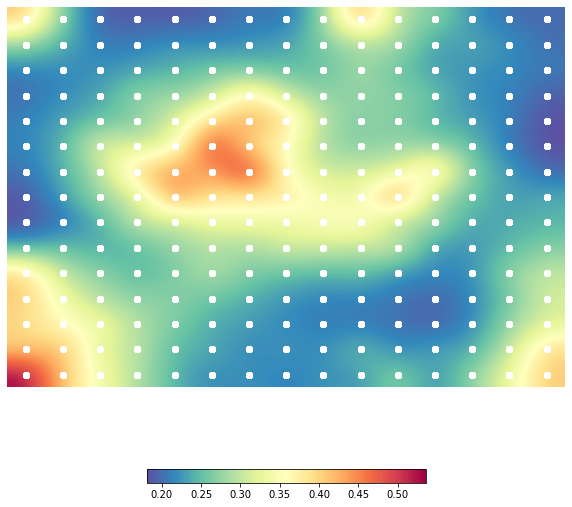

CPU times: user 1min 24s, sys: 97.7 ms, total: 1min 24s
Wall time: 43.5 s


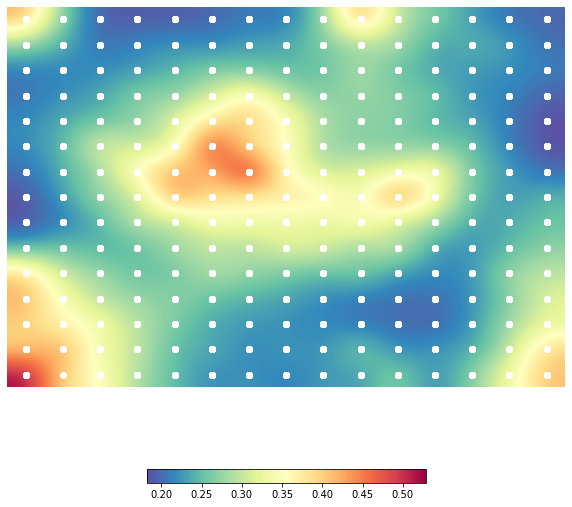

CPU times: user 1min 25s, sys: 127 ms, total: 1min 25s
Wall time: 43.7 s


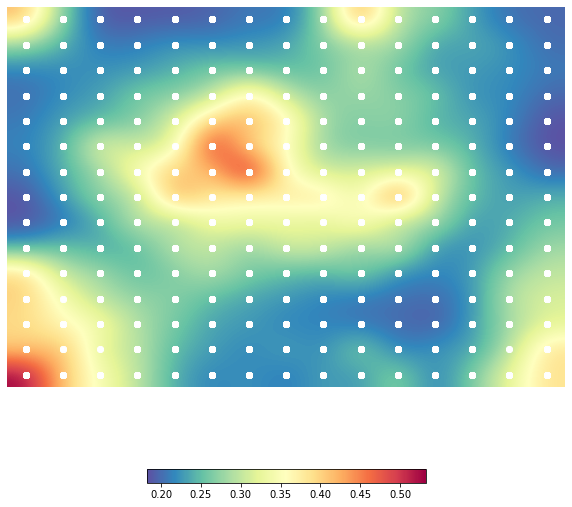

CPU times: user 1min 26s, sys: 145 ms, total: 1min 26s
Wall time: 44.3 s


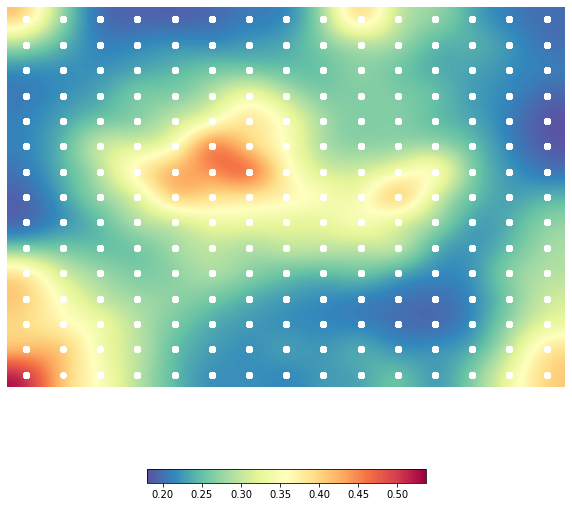

CPU times: user 1min 25s, sys: 148 ms, total: 1min 25s
Wall time: 44 s


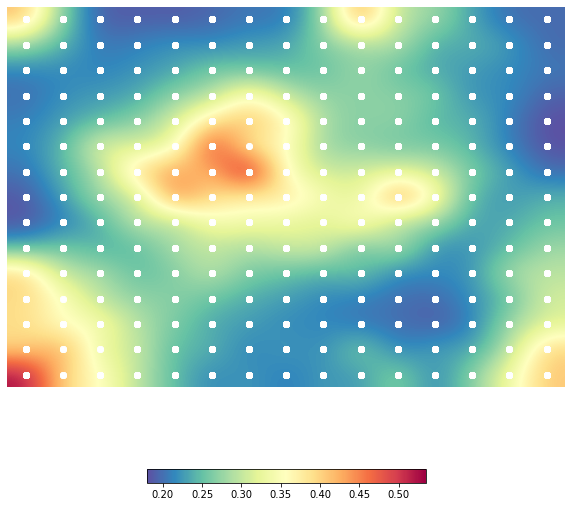

CPU times: user 1min 25s, sys: 144 ms, total: 1min 25s
Wall time: 43.8 s


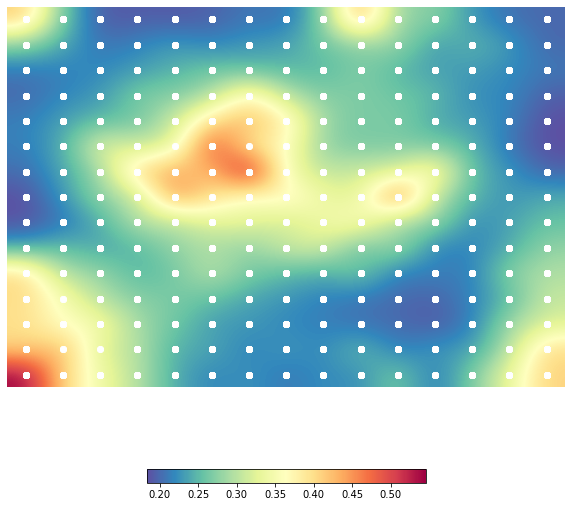

CPU times: user 1min 25s, sys: 111 ms, total: 1min 25s
Wall time: 44 s


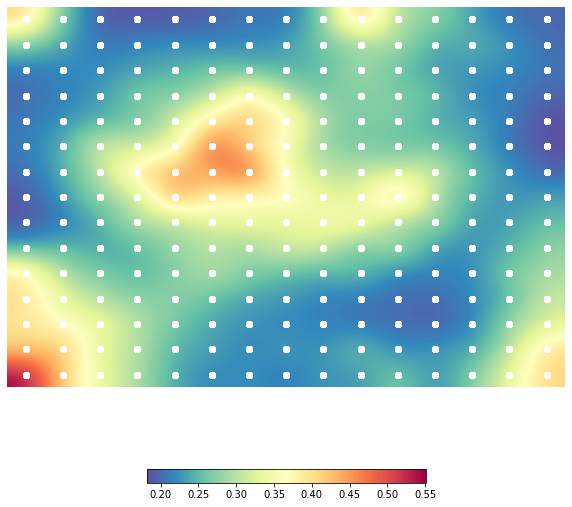

CPU times: user 1min 26s, sys: 128 ms, total: 1min 26s
Wall time: 44.3 s


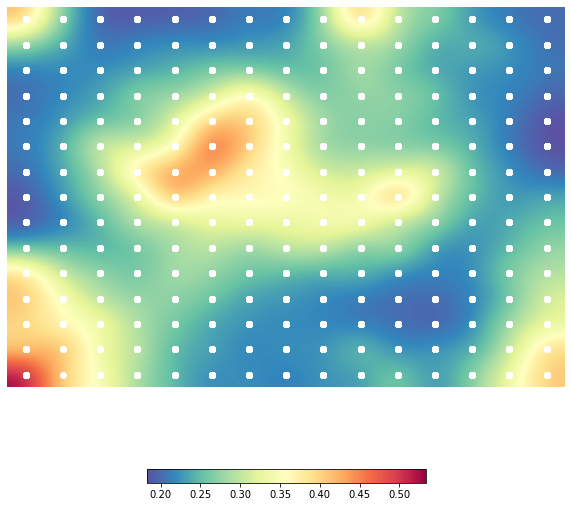

CPU times: user 1min 25s, sys: 125 ms, total: 1min 25s
Wall time: 44.1 s


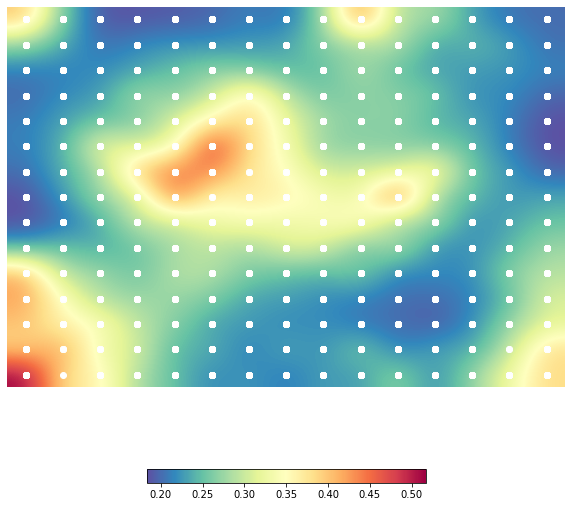

CPU times: user 1min 25s, sys: 144 ms, total: 1min 25s
Wall time: 43.9 s


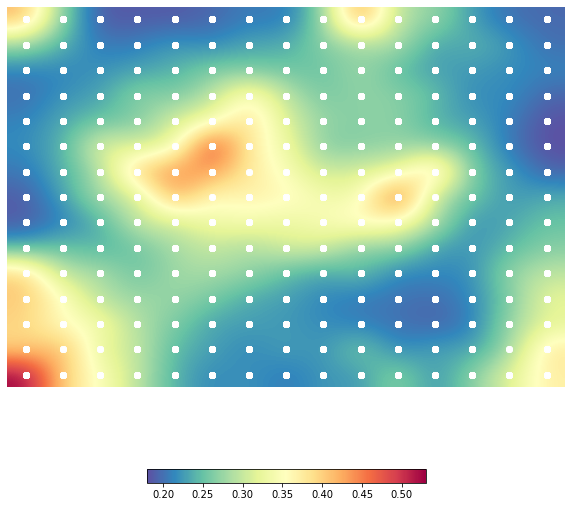

CPU times: user 1min 25s, sys: 95.9 ms, total: 1min 25s
Wall time: 43.9 s


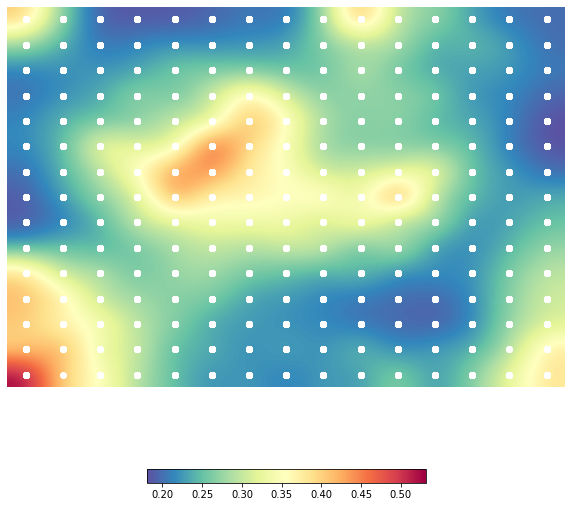

CPU times: user 1min 25s, sys: 130 ms, total: 1min 25s
Wall time: 44.1 s


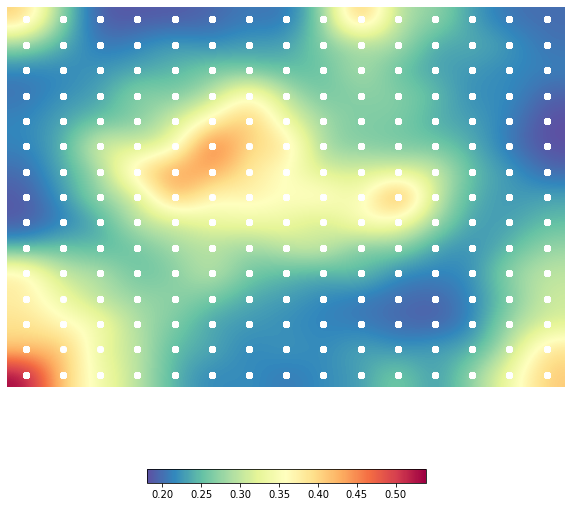

CPU times: user 1min 25s, sys: 107 ms, total: 1min 25s
Wall time: 43.8 s


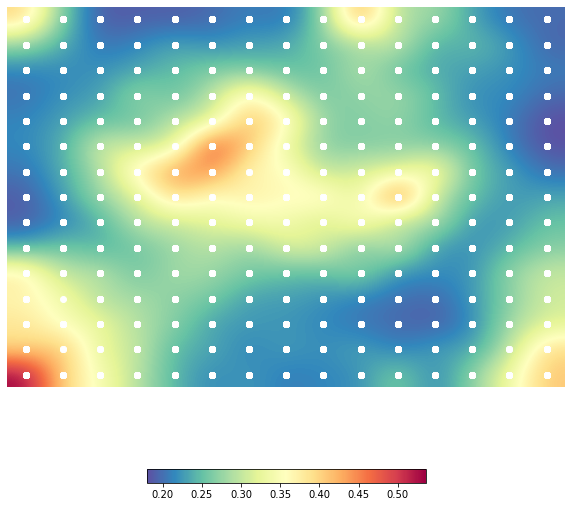

CPU times: user 1min 24s, sys: 144 ms, total: 1min 25s
Wall time: 43.6 s


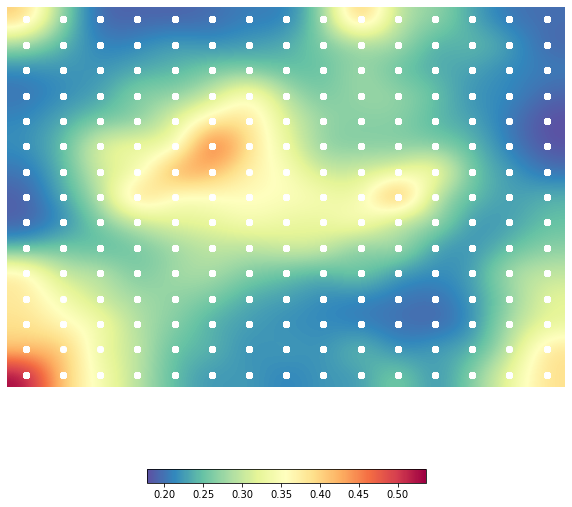

In [ ]:
som = somoclu.Somoclu(15, 15)
corpus_som = corpus_tf_idf.toarray()[:5000]
for i in range(100):
  %time som.train(corpus_som)
  som.view_umatrix(bestmatches=True, colorbar=True, figsize=(10,10))


## Best matching units

Μετά από κάθε εκπαίδευση αποθηκεύστε σε μια μεταβλητή τα best matching units (bmus) για κάθε ταινία. Τα bmus μας δείχνουν σε ποιο νευρώνα ανήκει η κάθε ταινία. Προσοχή: η σύμβαση των συντεταγμένων των νευρώνων είναι (στήλη, γραμμή) δηλαδή το ανάποδο από την Python. Με χρήση της [np.unique](https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.unique.html) (μια πολύ χρήσιμη συνάρτηση στην άσκηση) αποθηκεύστε τα μοναδικά best matching units και τους δείκτες τους (indices) προς τις ταινίες. Σημειώστε ότι μπορεί να έχετε λιγότερα μοναδικά bmus από αριθμό νευρώνων γιατί μπορεί σε κάποιους νευρώνες να μην έχουν ανατεθεί ταινίες. Ως αριθμό νευρώνα θα θεωρήσουμε τον αριθμό γραμμής στον πίνακα μοναδικών bmus.


In [ ]:
bmus = som.bmus
print(bmus.shape)

ubmus, indices = np.unique(bmus, return_inverse=True, axis=0) #very useful function
print(ubmus)
print(indices)

(5000, 2)
[[ 0  0]
 [ 0  1]
 [ 0  2]
 [ 0  3]
 [ 0  4]
 [ 0  5]
 [ 0  6]
 [ 0  7]
 [ 0  8]
 [ 0  9]
 [ 0 10]
 [ 0 11]
 [ 0 12]
 [ 0 13]
 [ 0 14]
 [ 1  0]
 [ 1  1]
 [ 1  2]
 [ 1  3]
 [ 1  4]
 [ 1  5]
 [ 1  6]
 [ 1  7]
 [ 1  8]
 [ 1  9]
 [ 1 10]
 [ 1 11]
 [ 1 12]
 [ 1 13]
 [ 1 14]
 [ 2  0]
 [ 2  1]
 [ 2  2]
 [ 2  3]
 [ 2  4]
 [ 2  5]
 [ 2  6]
 [ 2  7]
 [ 2  8]
 [ 2  9]
 [ 2 10]
 [ 2 11]
 [ 2 12]
 [ 2 13]
 [ 2 14]
 [ 3  0]
 [ 3  1]
 [ 3  2]
 [ 3  3]
 [ 3  4]
 [ 3  5]
 [ 3  6]
 [ 3  7]
 [ 3  8]
 [ 3  9]
 [ 3 10]
 [ 3 11]
 [ 3 12]
 [ 3 13]
 [ 3 14]
 [ 4  0]
 [ 4  1]
 [ 4  2]
 [ 4  3]
 [ 4  4]
 [ 4  5]
 [ 4  6]
 [ 4  7]
 [ 4  8]
 [ 4  9]
 [ 4 10]
 [ 4 11]
 [ 4 12]
 [ 4 13]
 [ 4 14]
 [ 5  0]
 [ 5  1]
 [ 5  2]
 [ 5  3]
 [ 5  4]
 [ 5  5]
 [ 5  6]
 [ 5  7]
 [ 5  8]
 [ 5  9]
 [ 5 10]
 [ 5 11]
 [ 5 12]
 [ 5 13]
 [ 5 14]
 [ 6  0]
 [ 6  1]
 [ 6  2]
 [ 6  3]
 [ 6  4]
 [ 6  5]
 [ 6  6]
 [ 6  7]
 [ 6  8]
 [ 6  9]
 [ 6 10]
 [ 6 11]
 [ 6 12]
 [ 6 13]
 [ 6 14]
 [ 7  0]
 [ 7  1]
 [ 7  2]
 [ 7  3]
 [ 7  4]



## Ομαδοποίηση (clustering)

Τυπικά, η ομαδοποίηση σε ένα χάρτη SOM προκύπτει από το unified distance matrix (U-matrix): για κάθε κόμβο υπολογίζεται η μέση απόστασή του από τους γειτονικούς κόμβους. Εάν χρησιμοποιηθεί μπλε χρώμα στις περιοχές του χάρτη όπου η τιμή αυτή είναι χαμηλή (μικρή απόσταση) και κόκκινο εκεί που η τιμή είναι υψηλή (μεγάλη απόσταση), τότε μπορούμε να πούμε ότι οι μπλε περιοχές αποτελούν clusters και οι κόκκινες αποτελούν σύνορα μεταξύ clusters.

To somoclu δίνει την επιπρόσθετη δυνατότητα να κάνουμε ομαδοποίηση των νευρώνων χρησιμοποιώντας οποιονδήποτε αλγόριθμο ομαδοποίησης του scikit-learn. Στην άσκηση θα χρησιμοποιήσουμε τον k-Means. Για τον αρχικό σας χάρτη δοκιμάστε ένα k=20 ή 25. Οι δύο προσεγγίσεις ομαδοποίησης είναι διαφορετικές, οπότε περιμένουμε τα αποτελέσματα να είναι κοντά αλλά όχι τα ίδια.


In [ ]:
from sklearn.cluster import KMeans
som.cluster(algorithm=KMeans(n_clusters=25))


## Αποθήκευση του SOM

Επειδή η αρχικοποίηση του SOM γίνεται τυχαία και το clustering είναι και αυτό στοχαστική διαδικασία, οι θέσεις και οι ετικέτες των νευρώνων και των clusters θα είναι διαφορετικές κάθε φορά που τρέχετε τον χάρτη, ακόμα και με τις ίδιες παραμέτρους. Για να αποθηκεύσετε ένα συγκεκριμένο som και clustering χρησιμοποιήστε και πάλι την `joblib`. Μετά την ανάκληση ενός SOM θυμηθείτε να ακολουθήσετε τη διαδικασία για τα bmus.


In [ ]:
joblib.dump(som, 'som.pkl') 

['som.pkl']


## Οπτικοποίηση U-matrix, clustering και μέγεθος clusters

Για την εκτύπωση του U-matrix χρησιμοποιήστε τη `view_umatrix` με ορίσματα `bestmatches=True` και `figsize=(15, 15)` ή `figsize=(20, 20)`. Τα διαφορετικά χρώματα που εμφανίζονται στους κόμβους αντιπροσωπεύουν τα διαφορετικά clusters που προκύπτουν από τον k-Means. Μπορείτε να εμφανίσετε τη λεζάντα του U-matrix με το όρισμα `colorbar`. Μην τυπώνετε τις ετικέτες (labels) των δειγμάτων, είναι πολύ μεγάλος ο αριθμός τους.

Για μια δεύτερη πιο ξεκάθαρη οπτικοποίηση του clustering τυπώστε απευθείας τη μεταβλητή `clusters`.

Τέλος, χρησιμοποιώντας πάλι την `np.unique` (με διαφορετικό όρισμα) και την `np.argsort` (υπάρχουν και άλλοι τρόποι υλοποίησης) εκτυπώστε τις ετικέτες των clusters (αριθμοί από 0 έως k-1) και τον αριθμό των νευρώνων σε κάθε cluster, με φθίνουσα ή αύξουσα σειρά ως προς τον αριθμό των νευρώνων. Ουσιαστικά είναι ένα εργαλείο για να βρίσκετε εύκολα τα μεγάλα και μικρά clusters. 

Ακολουθεί ένα μη βελτιστοποιημένο παράδειγμα για τις τρεις προηγούμενες εξόδους:

<img src="https://image.ibb.co/i0tsfR/umatrix_s.jpg" width="35%">
<img src="https://image.ibb.co/nLgHEm/clusters.png" width="35%">



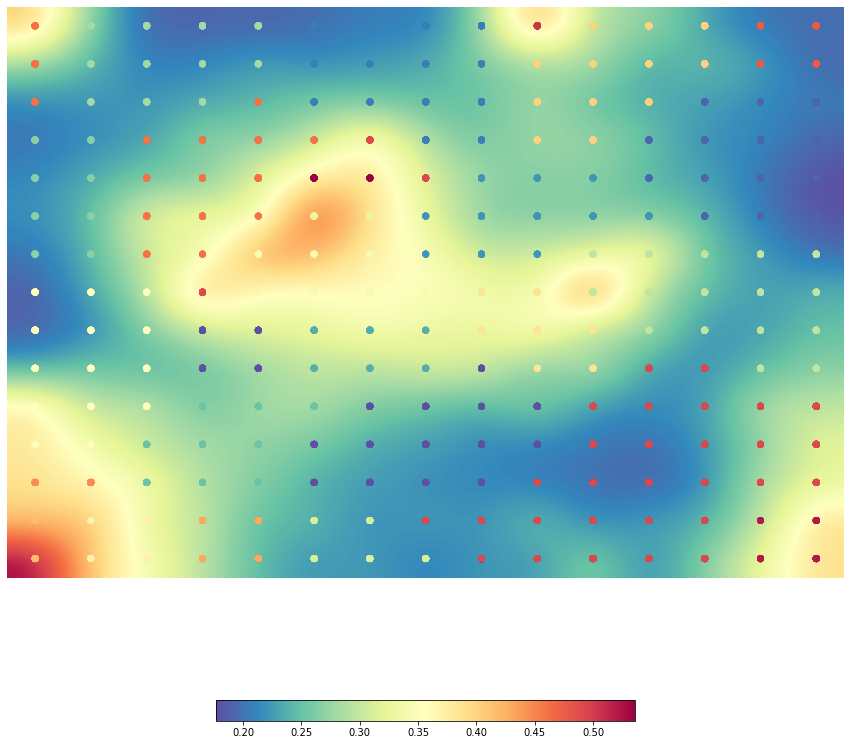

[[19  7  7  7  7  2  2  2  2 22 15 15 15 20 20]
 [19  7  7  7  7  2  2  2  2 15 15 15 15 20 20]
 [19  7  7  7 19  2  2  2  2 15 15 15  1  1  1]
 [ 6  6 19 19 19 19 21  2  2 15 15  1  1  1  1]
 [ 6  6 19 19 19 24 24 21  3  3  3  1  1  1  1]
 [ 6  6 19 19 19 10 10  3  3  3  3  3  1  1  1]
 [ 6  6 19 19 11 11 11  3  3  3  8  8  8  8  8]
 [12 12 12 21 11 11 11 11 14 14  8  8  8  8  8]
 [12 12 12  0  0  4  4  4 14 14 14  8  8  8  8]
 [12 12 12  0  0  4  4  4  0 14 14 21 21  8  8]
 [12 12 12  5  5  5  0  0  0  0 21 21 21 21 21]
 [12 12  5  5  5  0  0  0  0  0 21 21 21 21 21]
 [18 18  5  5  5  0  0  0  0 21 21 21 21 21 21]
 [16 13 13 17 17  9  9 21 21 21 21 21 21 23 23]
 [16 13 13 17 17  9  9  9 21 21 21 21 21 23 23]]
Clusters sorted by increasing order of neurons:
[22 24 10 16 18 20 23 13 17  9  4 11 14  6  5  7  3 15 12  2  1 19  8  0
 21]
[ 1  2  2  2  2  4  4  4  4  5  6  7  7  8  9 11 11 12 14 14 14 16 16 18
 32]


In [ ]:
som.view_umatrix(bestmatches=True, colorbar=True, figsize=(15,15))
print(som.clusters)

print('Clusters sorted by increasing order of neurons:')
clusts, freqs = np.unique(som.clusters, return_counts=True)
print(np.argsort(freqs))
freqs.sort()
print(freqs)


## Σημασιολογική ερμηνεία των clusters

Προκειμένου να μελετήσουμε τις τοπολογικές ιδιότητες του SOM και το αν έχουν ενσωματώσει σημασιολογική πληροφορία για τις ταινίες διαμέσου της διανυσματικής αναπαράστασης με το tf-idf και των κατηγοριών, χρειαζόμαστε ένα κριτήριο ποιοτικής επισκόπησης των clusters. Θα υλοποιήσουμε το εξής κριτήριο: Λαμβάνουμε όρισμα έναν αριθμό (ετικέτα) cluster. Για το cluster αυτό βρίσκουμε όλους τους νευρώνες που του έχουν ανατεθεί από τον k-Means. Για όλους τους νευρώνες αυτούς βρίσκουμε όλες τις ταινίες που τους έχουν ανατεθεί (για τις οποίες αποτελούν bmus). Για όλες αυτές τις ταινίες τυπώνουμε ταξινομημένη τη συνολική στατιστική όλων των ειδών (κατηγοριών) και τις συχνότητές τους. Αν το cluster διαθέτει καλή συνοχή και εξειδίκευση, θα πρέπει κάποιες κατηγορίες να έχουν σαφώς μεγαλύτερη συχνότητα από τις υπόλοιπες. Θα μπορούμε τότε να αναθέσουμε αυτήν/ές την/τις κατηγορία/ες ως ετικέτες κινηματογραφικού είδους στο cluster.

Μπορείτε να υλοποιήσετε τη συνάρτηση αυτή όπως θέλετε. Μια πιθανή διαδικασία θα μπορούσε να είναι η ακόλουθη:

1. Ορίζουμε συνάρτηση `print_categories_stats` που δέχεται ως είσοδο λίστα με ids ταινιών. Δημιουργούμε μια κενή λίστα συνολικών κατηγοριών. Στη συνέχεια, για κάθε ταινία επεξεργαζόμαστε το string `categories` ως εξής: δημιουργούμε μια λίστα διαχωρίζοντας το string κατάλληλα με την `split` και αφαιρούμε τα whitespaces μεταξύ ετικετών με την `strip`. Προσθέτουμε τη λίστα αυτή στη συνολική λίστα κατηγοριών με την `extend`. Τέλος χρησιμοποιούμε πάλι την `np.unique` για να μετρήσουμε συχνότητα μοναδικών ετικετών κατηγοριών και ταξινομούμε με την `np.argsort`. Τυπώνουμε τις κατηγορίες και τις συχνότητες εμφάνισης ταξινομημένα. Χρήσιμες μπορεί να σας φανούν και οι `np.ravel`, `np.nditer`, `np.array2string` και `zip`.

2. Ορίζουμε τη βασική μας συνάρτηση `print_cluster_neurons_movies_report` που δέχεται ως όρισμα τον αριθμό ενός cluster. Με τη χρήση της `np.where` μπορούμε να βρούμε τις συντεταγμένες των bmus που αντιστοιχούν στο cluster και με την `column_stack` να φτιάξουμε έναν πίνακα bmus για το cluster. Προσοχή στη σειρά (στήλη - σειρά) στον πίνακα bmus. Για κάθε bmu αυτού του πίνακα ελέγχουμε αν υπάρχει στον πίνακα μοναδικών bmus που έχουμε υπολογίσει στην αρχή συνολικά και αν ναι προσθέτουμε το αντίστοιχο index του νευρώνα σε μια λίστα. Χρήσιμες μπορεί να είναι και οι `np.rollaxis`, `np.append`, `np.asscalar`. Επίσης πιθανώς να πρέπει να υλοποιήσετε ένα κριτήριο ομοιότητας μεταξύ ενός bmu και ενός μοναδικού bmu από τον αρχικό πίνακα bmus.

3. Υλοποιούμε μια βοηθητική συνάρτηση `neuron_movies_report`. Λαμβάνει ένα σύνολο νευρώνων από την `print_cluster_neurons_movies_report` και μέσω της `indices` φτιάχνει μια λίστα με το σύνολο ταινιών που ανήκουν σε αυτούς τους νευρώνες. Στο τέλος καλεί με αυτή τη λίστα την `print_categories_stats` που τυπώνει τις στατιστικές των κατηγοριών.

Μπορείτε βέβαια να προσθέσετε οποιαδήποτε επιπλέον έξοδο σας βοηθάει. Μια χρήσιμη έξοδος είναι πόσοι νευρώνες ανήκουν στο cluster και σε πόσους και ποιους από αυτούς έχουν ανατεθεί ταινίες.

Θα επιτελούμε τη σημασιολογική ερμηνεία του χάρτη καλώντας την `print_cluster_neurons_movies_report` με τον αριθμός ενός cluster που μας ενδιαφέρει. 

Παράδειγμα εξόδου για ένα cluster (μη βελτιστοποιημένος χάρτης, ωστόσο βλέπετε ότι οι μεγάλες κατηγορίες έχουν σημασιολογική  συνάφεια):

```
Overall Cluster Genres stats:  
[('"Horror"', 86), ('"Science Fiction"', 24), ('"B-movie"', 16), ('"Monster movie"', 10), ('"Creature Film"', 10), ('"Indie"', 9), ('"Zombie Film"', 9), ('"Slasher"', 8), ('"World cinema"', 8), ('"Sci-Fi Horror"', 7), ('"Natural horror films"', 6), ('"Supernatural"', 6), ('"Thriller"', 6), ('"Cult"', 5), ('"Black-and-white"', 5), ('"Japanese Movies"', 4), ('"Short Film"', 3), ('"Drama"', 3), ('"Psychological thriller"', 3), ('"Crime Fiction"', 3), ('"Monster"', 3), ('"Comedy"', 2), ('"Western"', 2), ('"Horror Comedy"', 2), ('"Archaeology"', 2), ('"Alien Film"', 2), ('"Teen"', 2), ('"Mystery"', 2), ('"Adventure"', 2), ('"Comedy film"', 2), ('"Combat Films"', 1), ('"Chinese Movies"', 1), ('"Action/Adventure"', 1), ('"Gothic Film"', 1), ('"Costume drama"', 1), ('"Disaster"', 1), ('"Docudrama"', 1), ('"Film adaptation"', 1), ('"Film noir"', 1), ('"Parody"', 1), ('"Period piece"', 1), ('"Action"', 1)]```
   

In [ ]:
def print_categories_stats(movie_ids):
  categs=[]
  for i in movie_ids:
    categs.extend(categories[i][0][1:-1].split('",  "'))
  print(categs)
  categs1, freqs = np.unique(categs, return_counts=True)
  for i in np.argsort(freqs):
    print(categs1[i])
  freqs.sort()
  print(freqs)

In [ ]:
def print_cluster_neurons_movies_report(cluster_id):
  cluster_bmus = np.where(som.clusters==cluster_id)
  cluster_positions = np.column_stack(cluster_bmus)
  cluster_movies = []
  for i in cluster_positions:
    for j in range(ubmus.shape[0]):
      if i[0]==ubmus[j][0] and i[1]==ubmus[j][1]:
        cluster_movies.append(j)
  return cluster_movies

In [ ]:
def neuron_movies_report(cluster_id):
  neurons = print_cluster_neurons_movies_report(cluster_id)
  ind = [indices[i] for i in neurons]
  print_categories_stats(ind)


## Tips για το SOM και το clustering

- Για την ομαδοποίηση ένα U-matrix καλό είναι να εμφανίζει και μπλε-πράσινες περιοχές (clusters) και κόκκινες περιοχές (ορίων). Παρατηρήστε ποια σχέση υπάρχει μεταξύ αριθμού ταινιών στο final set, μεγέθους grid και ποιότητας U-matrix.
- Για το k του k-Means προσπαθήστε να προσεγγίζει σχετικά τα clusters του U-matrix (όπως είπαμε είναι διαφορετικοί μέθοδοι clustering). Μικρός αριθμός k δεν θα σέβεται τα όρια. Μεγάλος αριθμός θα δημιουργεί υπο-clusters εντός των clusters που φαίνονται στο U-matrix. Το τελευταίο δεν είναι απαραίτητα κακό, αλλά μεγαλώνει τον αριθμό clusters που πρέπει να αναλυθούν σημασιολογικά.
- Σε μικρούς χάρτες και με μικρά final sets δοκιμάστε διαφορετικές παραμέτρους για την εκπαίδευση του SOM. Σημειώστε τυχόν παραμέτρους που επηρεάζουν την ποιότητα του clustering για το dataset σας ώστε να τις εφαρμόσετε στους μεγάλους χάρτες.
- Κάποια τοπολογικά χαρακτηριστικά εμφανίζονται ήδη σε μικρούς χάρτες. Κάποια άλλα χρειάζονται μεγαλύτερους χάρτες. Δοκιμάστε μεγέθη 20x20, 25x25 ή και 30x30 και αντίστοιχη προσαρμογή των k. Όσο μεγαλώνουν οι χάρτες, μεγαλώνει η ανάλυση του χάρτη αλλά μεγαλώνει και ο αριθμός clusters που πρέπει να αναλυθούν.


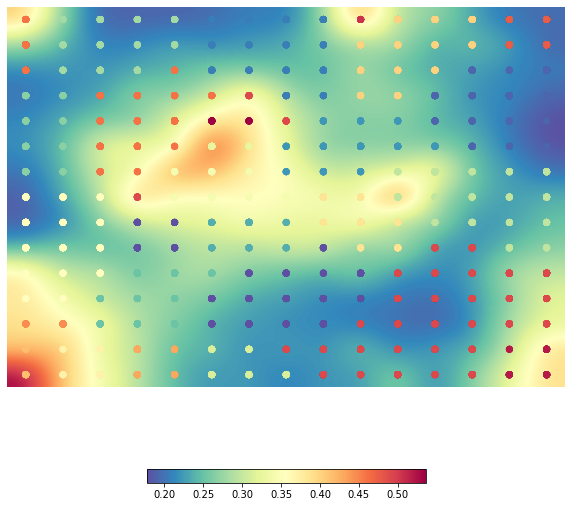

[[19  7  7  7  7  2  2  2  2 22 15 15 15 20 20]
 [19  7  7  7  7  2  2  2  2 15 15 15 15 20 20]
 [19  7  7  7 19  2  2  2  2 15 15 15  1  1  1]
 [ 6  6 19 19 19 19 21  2  2 15 15  1  1  1  1]
 [ 6  6 19 19 19 24 24 21  3  3  3  1  1  1  1]
 [ 6  6 19 19 19 10 10  3  3  3  3  3  1  1  1]
 [ 6  6 19 19 11 11 11  3  3  3  8  8  8  8  8]
 [12 12 12 21 11 11 11 11 14 14  8  8  8  8  8]
 [12 12 12  0  0  4  4  4 14 14 14  8  8  8  8]
 [12 12 12  0  0  4  4  4  0 14 14 21 21  8  8]
 [12 12 12  5  5  5  0  0  0  0 21 21 21 21 21]
 [12 12  5  5  5  0  0  0  0  0 21 21 21 21 21]
 [18 18  5  5  5  0  0  0  0 21 21 21 21 21 21]
 [16 13 13 17 17  9  9 21 21 21 21 21 21 23 23]
 [16 13 13 17 17  9  9  9 21 21 21 21 21 23 23]]
['Action', 'Drama', 'Adventure', 'War film', 'Action/Adventure', 'Western', 'Action', 'Musical', 'Drama', 'War film', 'Silent film', 'Ensemble Film', 'Indie', 'Comedy-drama', 'Drama', 'Comedy', 'Black comedy', 'Action', 'Adventure', 'Thriller', 'Crime Fiction', 'Drama', 'Film no

In [ ]:
som.view_umatrix(bestmatches=True, colorbar=True, figsize=(10,10))
print(som.clusters)
neuron_movies_report(12)



## Ανάλυση τοπολογικών ιδιοτήτων χάρτη SOM

Μετά το πέρας της εκπαίδευσης και του clustering θα έχετε ένα χάρτη με τοπολογικές ιδιότητες ως προς τα είδη των ταίνιών της συλλογής σας, κάτι αντίστοιχο με την εικόνα στην αρχή της Εφαρμογής 2 αυτού του notebook (η συγκεκριμένη εικόνα είναι μόνο για εικονογράφιση, δεν έχει καμία σχέση με τη συλλογή δεδομένων και τις κατηγορίες μας).

Για τον τελικό χάρτη SOM που θα παράξετε για τη συλλογή σας, αναλύστε σε markdown με συγκεκριμένη αναφορά σε αριθμούς clusters και τη σημασιολογική ερμηνεία τους τις εξής τρεις τοπολογικές ιδιότητες του SOM: 

1. Δεδομένα που έχουν μεγαλύτερη πυκνότητα πιθανότητας στο χώρο εισόδου τείνουν να απεικονίζονται με περισσότερους νευρώνες στο χώρο μειωμένης διαστατικότητας. Δώστε παραδείγματα από συχνές και λιγότερο συχνές κατηγορίες ταινιών. Χρησιμοποιήστε τις στατιστικές των κατηγοριών στη συλλογή σας και τον αριθμό κόμβων που χαρακτηρίζουν.
2. Μακρινά πρότυπα εισόδου τείνουν να απεικονίζονται απομακρυσμένα στο χάρτη. Υπάρχουν χαρακτηριστικές κατηγορίες ταινιών που ήδη από μικρούς χάρτες τείνουν να τοποθετούνται σε διαφορετικά ή απομονωμένα σημεία του χάρτη.
3. Κοντινά πρότυπα εισόδου τείνουν να απεικονίζονται κοντά στο χάρτη. Σε μεγάλους χάρτες εντοπίστε είδη ταινιών και κοντινά τους υποείδη.

Προφανώς τοποθέτηση σε 2 διαστάσεις που να σέβεται μια απόλυτη τοπολογία δεν είναι εφικτή, αφενός γιατί δεν υπάρχει κάποια απόλυτη εξ ορισμού για τα κινηματογραφικά είδη ακόμα και σε πολλές διαστάσεις, αφετέρου γιατί πραγματοποιούμε μείωση διαστατικότητας.

Εντοπίστε μεγάλα clusters και μικρά clusters που δεν έχουν σαφή χαρακτηριστικά. Εντοπίστε clusters συγκεκριμένων ειδών που μοιάζουν να μην έχουν τοπολογική συνάφεια με γύρω περιοχές. Προτείνετε πιθανές ερμηνείες.



Τέλος, εντοπίστε clusters που έχουν κατά την άποψή σας ιδιαίτερο ενδιαφέρον στη συλλογή της ομάδας σας (data exploration / discovery value) και σχολιάστε.


1. Θα αναλύσουμε τους clusters 16 και 21. Ο cluster 16 εμφανίζεται μόλις δύο φορές στο χάρτη, ενώ ο cluster 21 εμφανίζεται αρκετά περισσότερες φορές. Παρακάτω παρατηρούμε τις κατηγορίες των επιμέρους νευρώνων και βλέπουμε ότι η κατηγορία "Comedy" εμφανίζεται 11 φορές στον cluster 3, ενώ μόλις μία στον cluster 1.

In [ ]:
neuron_movies_report(16)
neuron_movies_report(21)

['Crime Fiction', 'Comedy', 'Black-and-white', 'Musical']
Black-and-white
Comedy
Crime Fiction
Musical
[1 1 1 1]
['Romantic comedy', 'Romance Film', 'Comedy', 'Action/Adventure', 'Western', 'Action', 'Musical', 'Short Film', 'Silent film', 'Indie', 'Documentary', 'Comedy', 'Bollywood', 'Inspirational Drama', 'Drama', 'Indie', 'Thriller', 'Psychological thriller', 'Mystery', 'Drama', 'Suspense', 'Film adaptation', 'Crime Thriller', 'Sports', 'Film noir', 'Drama', 'Boxing', 'Black-and-white', 'Silent film', 'Indie', "Children's/Family", 'Black-and-white', 'Short Film', 'Comedy', 'Family Film', 'Comedy', 'Black-and-white', 'Comedy film', 'Romance Film', 'Family Film', 'Comedy', 'Thriller', 'Psychological thriller', 'Mystery', 'Drama', 'Suspense', 'Film adaptation', 'Crime Thriller', 'Romantic comedy', 'Musical', 'Comedy', 'Beach Film', 'Romance Film', 'Teen', 'Black comedy', 'Drama', 'Comedy', 'Thriller', 'Psychological thriller', 'Mystery', 'Drama', 'Suspense', 'Film adaptation', 'Crime 

2. Παρατηρούμε ότι ο cluster 1, ο οποίος βρίσκεται μακριά από τον cluster 12, περιέχει εντελώς διαφορετικά είδη ταινιών (πέρα από κάποια comedy και drama, τα οποία λόγω υπερπληθώρας υπάρχουν κοινά).

In [ ]:
neuron_movies_report(1)
neuron_movies_report(12)

['Drama', 'Horror', 'Bollywood', 'Musical', 'Drama', 'Bollywood', 'World cinema', 'Fantasy Comedy', 'Comedy', 'Thriller', 'Drama', 'Psychological thriller', 'Indie', 'Science Fiction', 'Horror', 'Doomsday film', 'Cult', 'Satire', 'Comedy', 'Zombie Film', 'Musical', 'Drama', 'Comedy', 'Teen', 'Thriller', 'Crime Fiction', 'Buddy film', 'Action Comedy', 'Comedy Thriller', 'Action/Adventure', 'Blaxploitation', 'Comedy', 'Action', 'Musical', 'Family Film', 'Comedy', 'Drama', 'Animation', 'Fairy tale', "Children's/Family", 'Melodrama', 'Indie', 'Period piece', 'Drama', 'Film adaptation', 'Romantic drama', 'Romance Film']
Action
Teen
Science Fiction
Satire
Romantic drama
Romance Film
Psychological thriller
Period piece
Melodrama
Film adaptation
Fantasy Comedy
World cinema
Fairy tale
Family Film
Doomsday film
Action Comedy
Action/Adventure
Animation
Blaxploitation
Buddy film
Children's/Family
Comedy Thriller
Crime Fiction
Cult
Zombie Film
Indie
Bollywood
Horror
Thriller
Musical
Comedy
Drama
[1

3. Παρατηρούμε ότι ο cluster 20 και ο cluster 1, που είναι γείτονες μεταξύ τους στο χάρτη, έχουν παρόμοια περιεχόμενα:

In [ ]:
neuron_movies_report(1)
neuron_movies_report(20)

['Drama', 'Horror', 'Bollywood', 'Musical', 'Drama', 'Bollywood', 'World cinema', 'Fantasy Comedy', 'Comedy', 'Thriller', 'Drama', 'Psychological thriller', 'Indie', 'Science Fiction', 'Horror', 'Doomsday film', 'Cult', 'Satire', 'Comedy', 'Zombie Film', 'Musical', 'Drama', 'Comedy', 'Teen', 'Thriller', 'Crime Fiction', 'Buddy film', 'Action Comedy', 'Comedy Thriller', 'Action/Adventure', 'Blaxploitation', 'Comedy', 'Action', 'Musical', 'Family Film', 'Comedy', 'Drama', 'Animation', 'Fairy tale', "Children's/Family", 'Melodrama', 'Indie', 'Period piece', 'Drama', 'Film adaptation', 'Romantic drama', 'Romance Film']
Action
Teen
Science Fiction
Satire
Romantic drama
Romance Film
Psychological thriller
Period piece
Melodrama
Film adaptation
Fantasy Comedy
World cinema
Fairy tale
Family Film
Doomsday film
Action Comedy
Action/Adventure
Animation
Blaxploitation
Buddy film
Children's/Family
Comedy Thriller
Crime Fiction
Cult
Zombie Film
Indie
Bollywood
Horror
Thriller
Musical
Comedy
Drama
[1

Υπάρχουν μερικά clusters τα οποία δεν έχουν σαφή χαρακτηριστικά, όπως το cluster 16. Αυτό οφείλεται στο γεγονός ότι ο καταμερισμός που γίνεται, επειδή οφείλεται σε περιγραφές ταινιών, στις οποίες ο τρόπος διαχωρισμού δεν είναι τετριμμένος, δεν είναι τόσο βέλτιστος ώστε να καταμοιράσει τις ταινίες με τον καλύτερο τρόπο στο SOM. Μία πιθανή λύση θα ήταν να αυξήσουμε τις διαστάσεις του χάρτη, τους νευρώνες ή ίσως και τα clusters, ή να γίνει πιο αναλυτικός ο καταμερισμός των ταινιών για το training.


# Τελική παράδοση άσκησης

- Θα παραδώσετε στο mycourses το παρόν notebook επεξεργασμένο με τις απαντήσεις σας για τα ζητούμενα και των δύο εφαρμογών. 
- Προσέξτε ώστε να **απαντήσετε σε όλα τα σημεία όπου απαιτείται**.
- Μαζί Θα παραδώσετε τα joblib dumps των τελικών `corpus_tf_idf.pkl` και `som.pkl` (μεγάλος χάρτης - 5000 ταινίες) που θα χρησιμοποιήσετε. Θυμηθείτε ότι η ανάλυση του χάρτη στο markdown με αναφορά σε αριθμούς clusters πρέπει να αναφέρεται στο dump του χάρτη που θα μας παραδώσετε αλλιώς ο χάρτης που θα προκύψει θα είναι διαφορετικός και τα labels των clusters δεν θα αντιστοιχούν στην ανάλυσή σας. Οδηγίες για την αποθήκευση των dumps θα βρείτε στο [FAQ](https://docs.google.com/document/d/1-E4eQkVnTxa3Jb0HL9OAs11bugYRRZ7RNWpu7yh9G4s/edit?usp=sharing). 
- Μην ξεχάσετε στην αρχή ένα κελί markdown με **τα στοιχεία της ομάδας σας**.
- Στο **zip** που θα παραδώσετε πρέπει να βρίσκονται **4 αρχεία (το .ipynb και το .py του notebook καθώς και τα δύο .pkl)**
- **Το maximum upload filesize στο mycourses είναι 29MB**, εάν το zip σας είναι μεγαλύτερο, δεν έχετε βελτιστοποιήσει το tfidf.

<table>
  <tr><td align="center">
    <font size="4">Παρακαλούμε διατρέξτε βήμα-βήμα το notebook για να μην ξεχάσετε παραδοτέα!</font>
</td>
  </tr>
</table>

## Ημερομηνία παράδοσης ##

Κυριακή 19 Ιανουαρίου 2020.

Καλή επιτυχία!
